
<div style="text-align: center; color: white; background-color: #559cff; font-weight: bold; padding: 20px" >
 <p style="font-size: 40px"> Project - Data Visualization 📊</p>
 <p style="font-size: 30px"><u>Topic: Hotel booking demand analysis</u></p>

</div>


---

## Thông tin nhóm 👬
| Họ tên              |MSSV       |
|-------------------|----------|
| Nguyễn Khánh Nhân | 21127657         |
| Huỳnh Sỉ Kha | 21127734         |
| Đoàn Nam Thắng     | 21127740 |

## Mức độ đóng góp
| Họ tên              | Tỉ lệ đóng góp       |
|-------------------|----------------------|
| Nguyễn Khánh Nhân | 100%         |
| Huỳnh Sỉ Kha | 100%         |
| Đoàn Nam Thắng     | 100%         |

### Import thư viện

In [1]:
import numpy as np
import pandas as pd

import seaborn as sns
import matplotlib.pyplot as plt

### Đọc dữ liệu

In [2]:
# Đọc dữ liệu từ file CSV
df = pd.read_csv("hotel_bookings.csv")

### I. Data understanding

##### 1. Đếm số dòng và số cột

In [3]:
num_rows, num_cols = df.shape
print("Số dòng:", num_rows)
print("Số cột:", num_cols)

Số dòng: 119390
Số cột: 32


##### 2. Viết bảng mô tả về các cột

Dữ liệu này mô tả hai bộ dữ liệu về nhu cầu khách sạn. Một trong những khách sạn (H1) là một khu nghỉ dưỡng và cái kia là một khách sạn thành phố (H2). 

- Cả hai bộ dữ liệu này có cùng cấu trúc, với 31 biến mô tả 40.060 quan sát của H1 và 79.330 quan sát của H2. Mỗi quan sát đại diện cho một đặt phòng khách sạn. 

- Cả hai bộ dữ liệu này bao gồm các đặt phòng dự kiến đến từ ngày 1 tháng 7 năm 2015 đến ngày 31 tháng 8 năm 2017, bao gồm các đặt phòng đã thực sự đến và các đặt phòng đã bị hủy. 

|Column|Description|
|---|---|
|hotel|	The type of hotel: Resort Hotel or City Hotel|
|is_canceled|	Whether the booking was canceled: 1 if canceled, 0 otherwise|
|lead_time|	Number of days that elapsed between the entering date of the booking into the "Property Management System" and the arrival date|
|arrival_date_year|	The year of arrival date|
|arrival_date_month|	The month of arrival date|
|arrival_date_week_number|	The week number of arrival date|
|arrival_date_day_of_month|	The day of month of arrival date|
|stays_in_weekend_nights|	Number of weekend nights (Saturday or Sunday) the guest stayed or booked to stay at the hotel|
|stays_in_week_nights|	Number of week nights (Monday to Friday) the guest stayed or booked to stay at the hotel|
|adults|	Number of adults|
|children|	Number of children|
|babies|	Number of babies|
|meal|	Type of meal booked. Categories are presented in standard hospitality meal packages: Undefined/SC – no meal package; BB – Bed & Breakfast; HB – Half board (breakfast and one other meal – usually dinner); FB – Full board (breakfast, lunch and dinner)|
|country|	Country of origin. Categories are represented in the ISO 3155–3:2013 format|
|market_segment|	Market segment designation. In categories, the term “TA” means “Travel Agents” and “TO” means “Tour Operators”|
|distribution_channel|	Booking distribution channel|
|is_repeated_guest|	Whether the guest is a repeated guest: 1 if repeated, 0 otherwise|
|previous_cancellations|	Number of previous bookings that were cancelled by the customer prior to the current booking|
|previous_bookings_not_canceled|	Number of previous bookings not cancelled by the customer prior to the current booking|
|reserved_room_type|	Code of room type reserved. Code is presented instead of designation for anonymity reasons.|
|assigned_room_type|	Code for the type of room assigned to the booking. Sometimes the assigned room type differs from the reserved room type due to hotel operation reasons (e.g. overbooking) or by customer request. Code is presented instead of designation for anonymity reasons.|
|booking_changes|	Number of changes/amendments made to the booking from the moment the booking was entered on the PMS until the moment of check-in or cancellation|
|deposit_type|	Type of deposit made for the booking|
|agent|	ID of the travel agency making the booking|
|company|	ID of the company/entity that made the booking or responsible for paying the booking. ID is presented instead of designation for anonymity reasons|
|days_in_waiting_list|	Number of days the booking was on the waiting list|
|customer_type|	Type of booking, assuming one of four categories: Contract - when the booking has an allotment or other type of contract associated to it; Group – when the booking is associated to a group; Transient – when the booking is not part of a group or contract, and is not associated to other transient booking; Transient-party – when the booking is transient, but is associated to at least other transient booking|
|adr|   Average Daily Rate as defined by dividing the sum of all lodging transactions by the total number of staying nights|
|required_car_parking_spaces|	Number of special requests made by the customer (e.g. twin bed or high floor)|
|total_of_special_requests|	Number of special requests made by the guest|
|reservation_status|	Reservation last status, assuming one of three categories: Canceled – booking was canceled by the customer; Check-Out – customer has checked in but already departed; No-Show – customer did not check-in and did inform the hotel of the reason why|
|reservation_status_date|	Date at which the last status was set. This variable can be used in conjunction with the ReservationStatus to understand when was the booking canceled or when did the customer checked-out of the hotel|

Mô tả về các thông số của các cột

In [4]:
column_description = df.describe(include='all').transpose()
column_description

,count,unique,top,freq,mean,std,min,25%,50%,75%,max
hotel,119390,2,City Hotel,79330,NaN,NaN,NaN,NaN,NaN,NaN,NaN
is_canceled,119390.0,NaN,NaN,NaN,0.370416,0.482918,0.0,0.0,0.0,1.0,1.0
lead_time,119390.0,NaN,NaN,NaN,104.011416,106.863097,0.0,18.0,69.0,160.0,737.0
arrival_date_year,119390.0,NaN,NaN,NaN,2016.156554,0.707476,2015.0,2016.0,2016.0,2017.0,2017.0
arrival_date_month,119390,12,August,13877,NaN,NaN,NaN,NaN,NaN,NaN,NaN
arrival_date_week_number,119390.0,NaN,NaN,NaN,27.165173,13.605138,1.0,16.0,28.0,38.0,53.0
arrival_date_day_of_month,119390.0,NaN,NaN,NaN,15.798241,8.780829,1.0,8.0,16.0,23.0,31.0
stays_in_weekend_nights,119390.0,NaN,NaN,NaN,0.927599,0.998613,0.0,0.0,1.0,2.0,19.0
stays_in_week_nights,119390.0,NaN,NaN,NaN,2.500302,1.908286,0.0,1.0,2.0,3.0,50.0
adults,119390.0,NaN,NaN,NaN,1.856403,0.579261,0.0,2.0,2.0,2.0,55.0


##### 3. Lấy 5 điểm dữ liệu ra làm mẫu

In [5]:
sample_data = df.head()
sample_data

,hotel,is_canceled,lead_time,arrival_date_year,arrival_date_month,arrival_date_week_number,arrival_date_day_of_month,stays_in_weekend_nights,stays_in_week_nights,adults,...,deposit_type,agent,company,days_in_waiting_list,customer_type,adr,required_car_parking_spaces,total_of_special_requests,reservation_status,reservation_status_date
0,Resort Hotel,0,342,2015,July,27,1,0,0,2,...,No Deposit,NaN,NaN,0,Transient,0.0,0,0,Check-Out,7/1/2015
1,Resort Hotel,0,737,2015,July,27,1,0,0,2,...,No Deposit,NaN,NaN,0,Transient,0.0,0,0,Check-Out,7/1/2015
2,Resort Hotel,0,7,2015,July,27,1,0,1,1,...,No Deposit,NaN,NaN,0,Transient,75.0,0,0,Check-Out,7/2/2015
3,Resort Hotel,0,13,2015,July,27,1,0,1,1,...,No Deposit,304.0,NaN,0,Transient,75.0,0,0,Check-Out,7/2/2015
4,Resort Hotel,0,14,2015,July,27,1,0,2,2,...,No Deposit,240.0,NaN,0,Transient,98.0,0,1,Check-Out,7/3/2015


##### 4. Phân tích tỷ lệ missing rate

In [6]:
missing_rate = df.isnull().sum()
print(missing_rate)

hotel                                  0
is_canceled                            0
lead_time                              0
arrival_date_year                      0
arrival_date_month                     0
arrival_date_week_number               0
arrival_date_day_of_month              0
stays_in_weekend_nights                0
stays_in_week_nights                   0
adults                                 0
children                               4
babies                                 0
meal                                   0
country                              488
market_segment                         0
distribution_channel                   0
is_repeated_guest                      0
previous_cancellations                 0
previous_bookings_not_canceled         0
reserved_room_type                     0
assigned_room_type                     0
booking_changes                        0
deposit_type                           0
agent                              16340
company         

Dựa vào kết quả trên, ta xử lý các cột có missing rate như sau:

- Tỉ lệ missing rate của cột 'children' là 0.003350% nên ta sẽ xử lý các ô dữ liệu missing trong cột này bằng cách điền vào giá trị median của cột

- Tỉ lệ missing rate của cột 'country' là 0.408744% nên ta sẽ xử lý các ô dữ liệu missing trong cột này bằng cách điền vào giá trị mode của cột

- Tỉ lệ missing rate của cột 'agent' là 13.686238% nên ta sẽ xử lý các ô dữ liệu missing trong cột này bằng cách điền vào giá trị -1
    
- Tỉ lệ missing rate của cột 'company' là 94.306893% nên ta sẽ xóa cột này khỏi dữ liệu

##### 5. Phân tích tỷ lệ duplicate

In [7]:
duplicate_rate = (df.duplicated().sum() / len(df)) * 100
print("\nTỷ lệ duplicate rate (%):", duplicate_rate)


Tỷ lệ duplicate rate (%): 26.797889270458164


Qua việc phân tích bộ dữ liệu trên, việc trùng lặp là hoàn toàn bình thường.

##### 6. Fill missing rate

In [8]:
# Đối với cột 'agent', điền vào giá trị -1 cho các ô dữ liệu missing
df['agent'] = df['agent'].fillna(-1)

# Đối với cột 'country', điền vào giá trị "Unknown" cho các ô dữ liệu missing
df['country'] = df['country'].fillna("Unknown")

# Đối với cột 'children', điền vào giá trị median cho các ô dữ liệu missing
df['children'] = df['children'].fillna(df['children'].median())

# Xóa cột 'company' vì chứa quá nhiều missing value
df = df.drop(columns=['company'])

Dữ liệu sau quá trình xử lý

In [9]:
print("\nDữ liệu sau khi fill missing rate:")
df.head()


Dữ liệu sau khi fill missing rate:


,hotel,is_canceled,lead_time,arrival_date_year,arrival_date_month,arrival_date_week_number,arrival_date_day_of_month,stays_in_weekend_nights,stays_in_week_nights,adults,...,booking_changes,deposit_type,agent,days_in_waiting_list,customer_type,adr,required_car_parking_spaces,total_of_special_requests,reservation_status,reservation_status_date
0,Resort Hotel,0,342,2015,July,27,1,0,0,2,...,3,No Deposit,-1.0,0,Transient,0.0,0,0,Check-Out,7/1/2015
1,Resort Hotel,0,737,2015,July,27,1,0,0,2,...,4,No Deposit,-1.0,0,Transient,0.0,0,0,Check-Out,7/1/2015
2,Resort Hotel,0,7,2015,July,27,1,0,1,1,...,0,No Deposit,-1.0,0,Transient,75.0,0,0,Check-Out,7/2/2015
3,Resort Hotel,0,13,2015,July,27,1,0,1,1,...,0,No Deposit,304.0,0,Transient,75.0,0,0,Check-Out,7/2/2015
4,Resort Hotel,0,14,2015,July,27,1,0,2,2,...,0,No Deposit,240.0,0,Transient,98.0,0,1,Check-Out,7/3/2015


### II. Data Preprocessing

Xóa đi các cột dữ liệu biến cate không cần thiết

In [10]:
# Xóa cột 'reservation_status_date' vì không cần thiết
df = df.drop(columns=['reservation_status_date'])

# Xóa cột 'reservation_status' vì không cần thiết
df = df.drop(columns=['reservation_status'])

Xóa đi các cột dữ liệu biến num không cần thiết

In [11]:
# Xóa cột 'arrival_date_week_number' vì không cần thiết
df = df.drop(columns=['arrival_date_week_number'])

# Xóa cột 'distribution_channel' vì cột này có thể suy ra từ 'market_segment'
df = df.drop(columns=['distribution_channel'])

# Xóa cột 'reserved_room_type' vì cột này đa phần suy ra từ 'assigned_room_type' 
# và nó không quan trọng trong việc phân tích
df = df.drop(columns=['reserved_room_type'])

Chuyển đổi dạng dữ liệu của các cột

In [12]:
# Chuyển đổi 'arrival_date_year' thành dạng categorical data
df['arrival_date_year'] = df['arrival_date_year'].astype(str) 

# Chuyển đổi 'is_canceled' thành dạng categorical data
df['is_canceled'] = df['is_canceled'].astype(str)

# Chuyển đổi 'is_repeat_guest' thành dạng categorical data
df['is_repeated_guest'] = df['is_repeated_guest'].astype(str)

Tạo dữ liệu cho Resort hotel và City hotel

In [13]:
clone_df = df.copy()
total_rh = clone_df.loc[(df["hotel"] == "Resort Hotel")]
total_ch = clone_df.loc[(df["hotel"] == "City Hotel")]

Để biết số lượng booking thực tế, tạo dữ liệu mới chỉ chứa dữ liệu đã book và không bị hủy

In [14]:
booked_rh = df.loc[(df["hotel"] == "Resort Hotel") & (df["is_canceled"] == "0")]
booked_ch = df.loc[(df["hotel"] == "City Hotel") & (df["is_canceled"] == "0")]

In [15]:
print("\nSố lượng booking thực tế:")
print("Resort Hotel:", len(booked_rh))
print("City Hotel:", len(booked_ch))


Số lượng booking thực tế:
Resort Hotel: 28938
City Hotel: 46228


### III. EDA 1D

##### 1. Chia loại dữ liệu num hoặc cate.

In [16]:
# Tạo list chứa tên các cột dữ liệu số và dữ liệu phân loại
numeric_cols = df.select_dtypes(include=['number']).columns
categorical_cols = df.select_dtypes(include=['category', 'object']).columns

In ra các kết quả của cột dữ liệu biến num và biến cate

In [17]:
numeric_cols

Index(['lead_time', 'arrival_date_day_of_month', 'stays_in_weekend_nights',
       'stays_in_week_nights', 'adults', 'children', 'babies',
       'previous_cancellations', 'previous_bookings_not_canceled',
       'booking_changes', 'agent', 'days_in_waiting_list', 'adr',
       'required_car_parking_spaces', 'total_of_special_requests'],
      dtype='object')

In [18]:
categorical_cols

Index(['hotel', 'is_canceled', 'arrival_date_year', 'arrival_date_month',
       'meal', 'country', 'market_segment', 'is_repeated_guest',
       'assigned_room_type', 'deposit_type', 'customer_type'],
      dtype='object')

##### 2. Phân tích tỷ lệ đối với biến cate.

2.1. Đối với City hotel và Resort hotel, số lượng booking từ những quốc gia nào là chủ yếu?

+ Đếm số lượng booking từ mỗi quốc gia

In [19]:
booked_rh_country_counts = booked_rh.loc[booked_rh["is_canceled"] == "0"]["country"].value_counts()
ch_country_counts = booked_ch.loc[booked_ch["is_canceled"] == "0"]["country"].value_counts()

+ Tỉ lệ booking theo quốc gia tại hai khách sạn

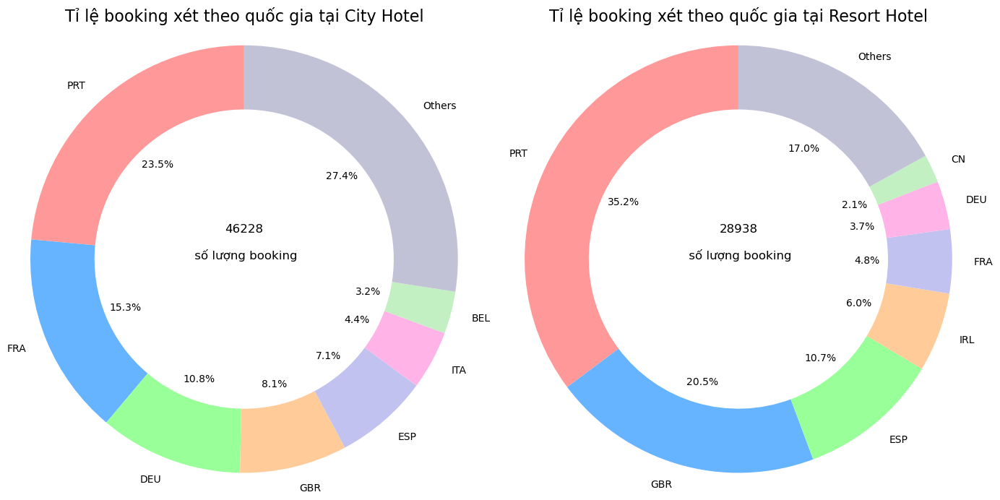

In [20]:
# Tạo figure với 2 subplot
fig, axes = plt.subplots(1, 2, figsize=(14, 7))

# Chỉ lấy 10 quốc gia phổ biến nhất và gom lại các quốc gia còn lại vào nhóm "Others" cho City Hotel
ch_top_countries = ch_country_counts.head(7)
ch_others = ch_country_counts[7:].sum()
ch_top_countries['Others'] = ch_others

# Tạo biểu đồ donut cho City Hotel
axes[0].pie(ch_top_countries, labels=ch_top_countries.index, autopct='%1.1f%%', startangle=90, colors = ['#ff9999', '#66b3ff', '#99ff99', '#ffcc99', '#c2c2f0', '#ffb3e6', '#c2f0c2', '#c2c2d6'], wedgeprops=dict(width=0.3))
axes[0].set_title('Tỉ lệ booking xét theo quốc gia tại City Hotel', fontsize=16)

# Thêm tổng số booking vào giữa donut
total_ch_bookings = ch_top_countries.sum()
axes[0].text(0, 0, f'{total_ch_bookings}\n\n số lượng booking', fontsize=12, color='black', ha='center')

axes[0].axis('equal')  # Đảm bảo biểu đồ là hình tròn

# Chỉ lấy 10 quốc gia phổ biến nhất và gom lại các quốc gia còn lại vào nhóm "Others" cho Resort Hotel
booked_rh_top_countries = booked_rh_country_counts.head(7)
booked_rh_others = booked_rh_country_counts[7:].sum()
booked_rh_top_countries['Others'] = booked_rh_others

# Tạo biểu đồ donut cho Resort Hotel
axes[1].pie(booked_rh_top_countries, labels=booked_rh_top_countries.index, autopct='%1.1f%%', startangle=90, colors = ['#ff9999', '#66b3ff', '#99ff99', '#ffcc99', '#c2c2f0', '#ffb3e6', '#c2f0c2', '#c2c2d6'], wedgeprops=dict(width=0.3))
axes[1].set_title('Tỉ lệ booking xét theo quốc gia tại Resort Hotel', fontsize=16)

# Thêm tổng số booking vào giữa donut
total_booked_rh_bookings = booked_rh_top_countries.sum()
axes[1].text(0, 0, f'{total_booked_rh_bookings}\n\n số lượng booking', fontsize=12, color='black', ha='center')

axes[1].axis('equal')  # Đảm bảo biểu đồ là hình tròn

plt.tight_layout()
plt.show()

- Đối với City hotel, khách nội địa chiếm 23,5\%, tiếp theo là các quốc gia cũng nằm ở trong khu vực Tây Âu như Pháp với 15,3\%, Đức với 10,8\%, Vương Quốc Anh với 8,1\%,...

- Đối với Resort hotel, khách nội địa chiếm tỉ lệ cao hơn City hotel với 35,2\%, tiếp theo là các quốc gia cũng nằm ở trong khu vực Tây Âu như Vương Quốc Anh với 20,5\%, Tây Ban Nha với 10,7\%, Ireland với 6,0\%,...

=> Vì hai khách sạn này cùng nằm ở Bồ Đào Nha nên số lượng khách đến hai khách sạn này nhiều nhất là khách nội địa, sau đó sẽ là khách hàng ở các quốc gia trong khu vực.

2.2. Tỉ lệ hủy phòng ở 2 khách sạn này có chênh lệch đáng kể hay không?

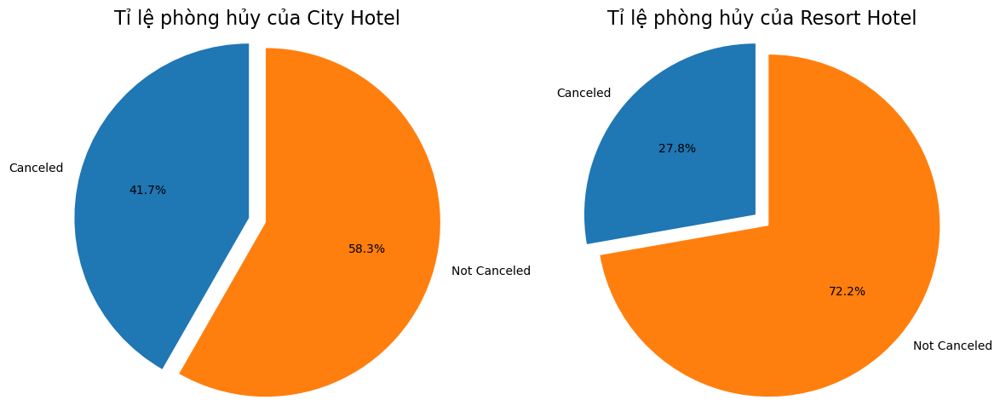

In [21]:
# Chuyển đổi cột "is_canceled" sang dạng số nguyên
total_rh = total_rh.copy()
total_rh["is_canceled"] = total_rh["is_canceled"].astype(int)

total_ch = total_ch.copy()
total_ch["is_canceled"] = total_ch["is_canceled"].astype(int)

# Tính tỉ lệ hủy của từng khách sạn
rh_cancel_percentage = (total_rh["is_canceled"].sum() / len(total_rh)) * 100
ch_cancel_percentage = (total_ch["is_canceled"].sum() / len(total_ch)) * 100

# Tạo dữ liệu cho biểu đồ tròn của Resort Hotel
rh_cancel_data = pd.DataFrame({
    'Status': ['Canceled', 'Not Canceled'],
    'Percentage': [rh_cancel_percentage, 100 - rh_cancel_percentage]
})

# Tạo dữ liệu cho biểu đồ tròn của City Hotel
ch_cancel_data = pd.DataFrame({
    'Status': ['Canceled', 'Not Canceled'],
    'Percentage': [ch_cancel_percentage, 100 - ch_cancel_percentage]
})

# Tạo subplot có 2 cột và 1 hàng
fig, axes = plt.subplots(1, 2, figsize=(12, 5))

# Vẽ biểu đồ tròn minh họa tỉ lệ phòng hủy của City Hotel
axes[0].pie(ch_cancel_data['Percentage'], labels=ch_cancel_data['Status'], autopct='%1.1f%%', startangle=90, explode=(0.1, 0))
axes[0].set_title('Tỉ lệ phòng hủy của City Hotel', fontsize=16)
axes[0].axis('equal')

# Vẽ biểu đồ tròn minh họa tỉ lệ phòng hủy của Resort Hotel
axes[1].pie(rh_cancel_data['Percentage'], labels=rh_cancel_data['Status'], autopct='%1.1f%%', startangle=90, explode=(0.1, 0))
axes[1].set_title('Tỉ lệ phòng hủy của Resort Hotel', fontsize=16)
axes[1].axis('equal')

plt.tight_layout()
plt.show()



- Có một sự chênh lệch đáng kể trong tỉ lệ hủy phòng của 2 khách sạn này, tỉ lệ hủy phòng của City hotel (41,7\%) cao gấp rưỡi so với tỉ lệ hủy phòng của Resort hotel (27,8\%).

=> Tỉ lệ hủy phòng ở City hotel đang ở mức cao, vì vậy cần có những sự phân tích để tìm ra nguyên nhân và có những chiến lược để giảm tỉ lệ này.

2.3. Tỉ lệ khách hàng đã từng đến khách sạn trên tổng số khách của khách sạn là bao nhiêu?

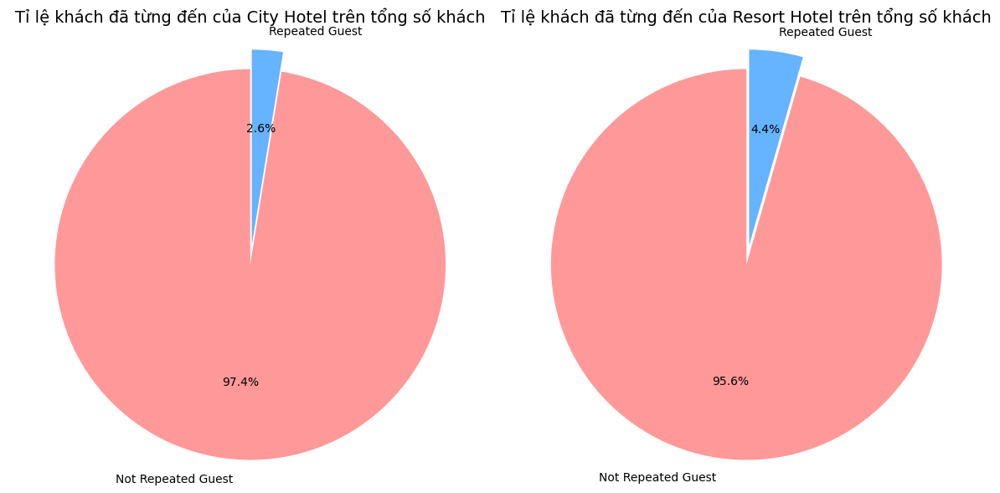

In [22]:
# Tính tỉ lệ is_repeated_guest cho City Hotel
ch_repeated_guest_counts = total_ch['is_repeated_guest'].value_counts(normalize=True) * 100

# Tính tỉ lệ is_repeated_guest cho Resort Hotel
rh_repeated_guest_counts = total_rh['is_repeated_guest'].value_counts(normalize=True) * 100

# Đánh lại nhãn cho is_repeated_guest
ch_repeated_guest_counts.index = ['Not Repeated Guest', 'Repeated Guest']
rh_repeated_guest_counts.index = ['Not Repeated Guest', 'Repeated Guest']

# Vẽ biểu đồ tròn cho City Hotel
plt.figure(figsize=(12, 6))
plt.subplot(1, 2, 1)
explode = (0.1, 0)  # Tách biệt giá trị 'Repeated Guest'
plt.pie(ch_repeated_guest_counts, labels=ch_repeated_guest_counts.index, autopct='%1.1f%%', startangle=90, colors=['#ff9999', '#66b3ff'], explode=explode)
plt.title('Tỉ lệ khách đã từng đến của City Hotel trên tổng số khách', fontsize=14)
plt.axis('equal')  
plt.tight_layout()

# Vẽ biểu đồ tròn cho Resort Hotel
plt.subplot(1, 2, 2)
explode = (0.1, 0)  # Tách biệt giá trị 'Repeated Guest'
plt.pie(rh_repeated_guest_counts, labels=rh_repeated_guest_counts.index, autopct='%1.1f%%', startangle=90, colors=['#ff9999', '#66b3ff'], explode=explode)
plt.title('Tỉ lệ khách đã từng đến của Resort Hotel trên tổng số khách', fontsize=14)
plt.axis('equal')  
plt.tight_layout()

plt.show()

- Khách hàng đến với hai khách sạn này đa phần đều là những khách hàng mớ. Tỉ lệ khách hàng đã từng đến khách sạn trên tổng số khách của City hotel và Resort hotel chỉ lần lượt là 2,6\% và 4,4\%.

=> Với tỉ lệ khách hàng mới đến chiếm đa số ở cả hai khách sạn, việc phân tích để tìm các phương thức để đảm bảo được tỉ lệ quay lại của hai khách sạn này là rất quan trọng.

2.4. Khách hàng thường sử dụng loại dịch vụ bữa ăn nào ở 2 khách sạn này?

- Dịch vụ ăn phổ biến nhất cho cả 2 khách sạn đó là BB (phục vụ kèm chỉ bữa ăn sáng) với hơn 35000 / 46228 khách hàng lựa chọn tại City hotel và hơn 20000 / 28938 khách hàng lựa chọn tại Resort hotel.

- Tại City hotel, hình thức bữa ăn phổ biến tiếp theo đó là SC (không có kèm dịch vụ bữa ăn) với hơn 5000 lựa chọn và HB (kèm dịch vụ bữa ăn sáng và thêm một bữa trưa hoặc tối) với gần 5000 lựa chọn. Hình thức FB (phục vụ đầy đủ cả 3 bữa) có số lượng người lựa chọn rất thấp.

- Tại Resort hotel, hình thức bữa ăn phổ biến tiếp theo đó là HB (kèm dịch vụ bữa ăn sáng và thêm một bữa trưa hoặc tối) với hơn 5000 lựa chọn, hình thức FB (phục vụ đầy đủ cả 3 bữa) và SC (không có kèm dịch vụ bữa ăn) có số lượng người lựa chọn rất thấp.

=> Dịch vụ BB được sử dụng phổ biến nhất vì khi khách đến khách sạn thường không có xu hướng dậy sớm để ra ngoài ăn. Trong khi đó dịch vụ FB hiếm được sử dụng vì nó hạn chế trải nghiệm ẩm thực của người dùng khi đến với khách sạn. Tại Resort hotel, dịch vụ SC hiếm được sử dụng vì khi đến ở tại Resort, khách hàng mong muốn nghỉ dưỡng nên việc không sử dụng dịch vụ ăn sẽ làm giảm trải nghiệm thư giãn của khách hàng.

2.5. Phân khúc thị trường nào chiếm tỉ trọng lớn trong hoạt động kinh doanh của 2 khách sạn?

- Hai khách sạn City hotel và Resort hotel có thứ tự về tỉ lệ khách hàng theo phân khúc thị trường là giống nhau: phổ biến nhất là việc đặt phòng thông qua Online TA (đặt online qua đại lý du lịch), sau đó đến Offline TA/TO (đặt offline qua đại lý du lịch / nhà vận hành tour), Direct, Group, Corporate, Complementary. Khác biệt là ở City hotel có việc đặt phòng từ Aviation (hãng hàng không đặt gói phòng cho nhân sự) với tỉ lệ nhỏ nhất so với các phân khúc khác. 

- Việc đặt phòng ở City hotel có tỉ lệ lớn hơn qua TA/TO so với Resort hotel, trong khi ở Resort hotel lại có tỉ lệ cao hơn với việc đặt Direct.

=> Việc đặt phòng qua khách sạn trong giai đoạn 2015 - 2017 ở một quốc gia phát triển (Bồ Đào Nha) phổ biến nhất là qua việc đặt online từ TA sau đó đến đặt offline từ TA/TO, hình thức đặt Direct thấp vì có thể xảy ra những vấn đề không thể biết trước như việc hết phòng hoặc khó khăn trong việc lựa chọn phòng.

2.6. Những loại tệp khách hàng nào là phổ biến tại 2 khách sạn?

- Hai khách sạn City hotel và Resort hotel có thứ tự về tỉ lệ khách hàng theo loại tệp khách hàng là giống nhau: phổ biến nhất là Transient (tạm thời), sau đó đến Transient-party (tạm thời nhưng có liên quan đến một đơn đặt phòng tạm thời khác), Contract (liên quan đến một hợp đồng), Group (liên quan đến một nhóm nào đó). 

=> Lí do cho điều này đó là đa phần khách hàng đến với khách sạn trong tình huống bất chợt và trải qua những bước đăng kí đơn giản và nhanh chóng nhất, vì vậy tỉ lệ Transient và Transient-party sẽ chiếm phổ biến nhất.

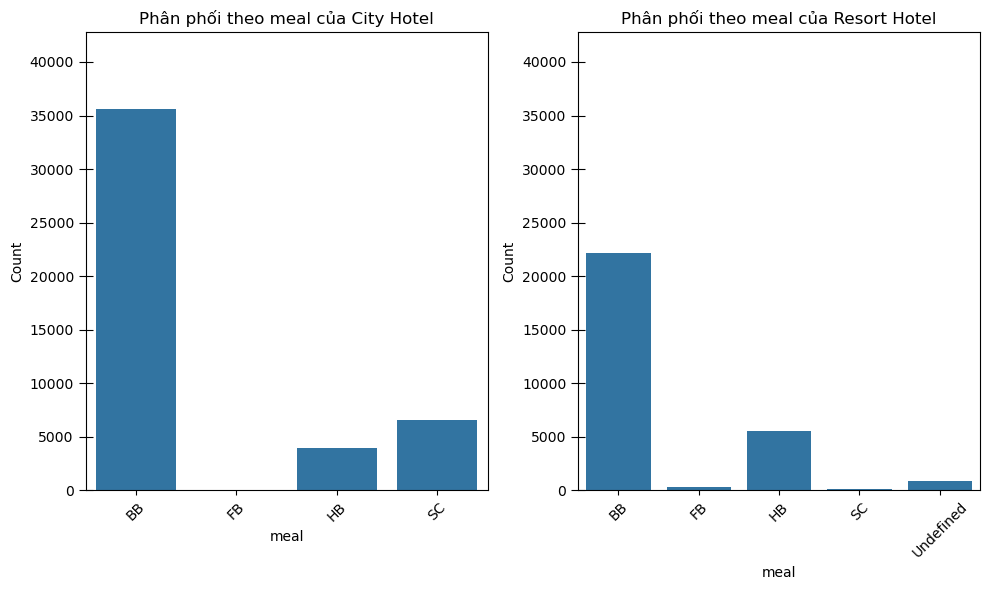

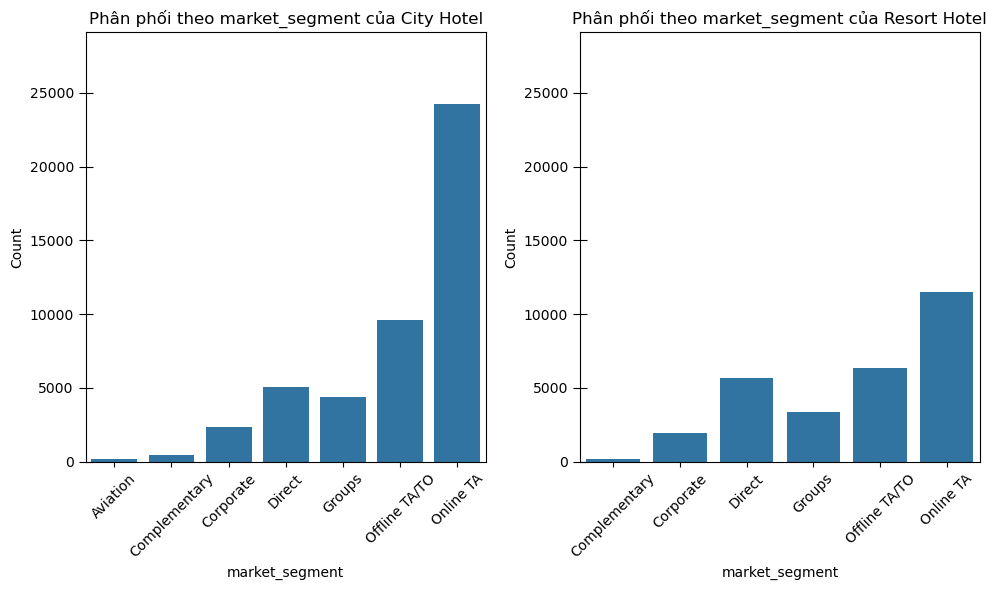

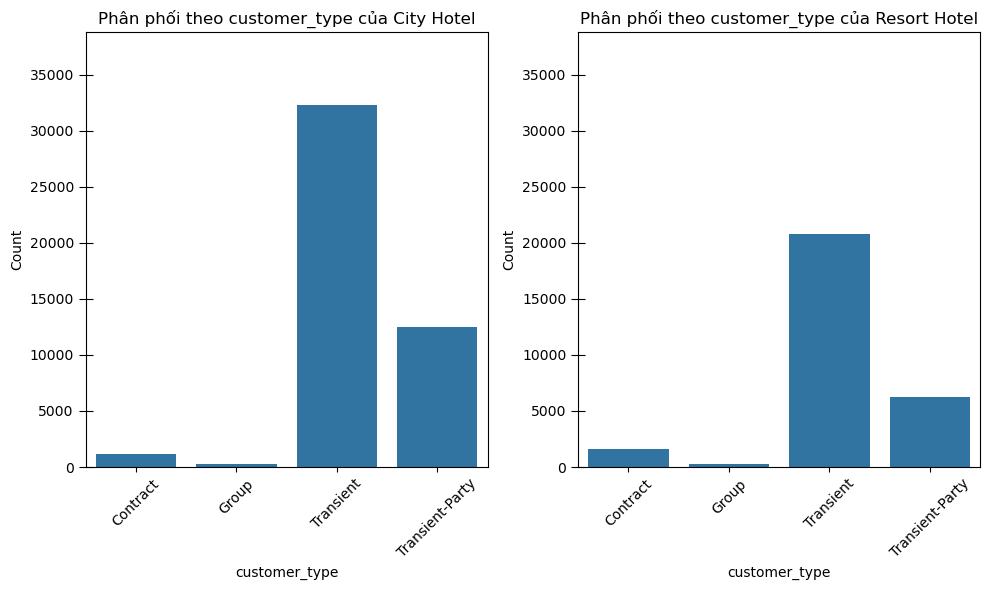

In [23]:
# Đối với mỗi cột dữ liệu
for col in ['meal', 'market_segment', 'customer_type']:
    # Tạo figure với 2 subplot
    fig, axes = plt.subplots(1, 2, figsize=(10, 6))
    
    # Vẽ biểu đồ cột cho City Hotel
    sns.countplot(data=booked_ch, x=col, ax=axes[0], order=sorted(booked_ch[col].unique()))
    axes[0].set_title(f'Phân phối theo {col} của City Hotel')
    axes[0].set_xlabel(col)
    axes[0].set_ylabel('Count')
    axes[0].tick_params(axis='x', rotation=45)  # Xoay nhãn trục x
    axes[0].tick_params(axis='y', direction='inout', length=10)  # Điều chỉnh chiều dài và hướng của các dấu tick
    axes[0].set_ylim(0, max(booked_rh[col].value_counts().max(), booked_ch[col].value_counts().max()) * 1.2)  # Đặt giới hạn trục y
    
    # Vẽ biểu đồ cột cho Resort Hotel
    sns.countplot(data=booked_rh, x=col, ax=axes[1], order=sorted(booked_rh[col].unique()))
    axes[1].set_title(f'Phân phối theo {col} của Resort Hotel')
    axes[1].set_xlabel(col)
    axes[1].set_ylabel('Count')
    axes[1].tick_params(axis='x', rotation=45)  # Xoay nhãn trục x
    axes[1].tick_params(axis='y', direction='inout', length=10)  # Điều chỉnh chiều dài và hướng của các dấu tick
    axes[1].set_ylim(0, max(booked_rh[col].value_counts().max(), booked_ch[col].value_counts().max()) * 1.2)  # Đặt giới hạn trục y
    
    plt.tight_layout()
    plt.show()


2.7. Phân tích biến động của số lượng booking tại hai khách sạn trong giai đoạn từ 7/2015 - 8/2017?

- Đối với City hotel:
    
    + Lượng booking khách sạn tăng trưởng đáng kể qua các năm. Năm 2016 có số lượng booking tăng mạnh so với năm 2015 (từ khoảng 1280 lên thành khoảng 1900 booking / tháng). Năm 2017 số lượng booking tiếp tục tăng lên gần 2000 bookings / tháng. 

    + Trong giai đoạn tháng 8/2016 đến tháng 3/2017, Các tháng đều có sự tăng trưởng dương so với cùng tháng của năm cũ. Trong giai đoạn tháng 4/2017 đến tháng 8/2017, mức tăng trưởng không còn luôn dương nữa, số lượng booking so với cùng tháng của năm cũ trong giai đoạn này không có biến động đáng kể.

- Đối với Resort hotel:

    + Năm 2016 có số lượng booking tăng so với năm 2015 (từ khoảng 1030 lên thành khoảng 1140 bookings / tháng). Năm 2017 số lượng booking không có sự thay đổi nào đáng kể so với 2016. 

    + Từ tháng 10 đến tháng 2 đạt mức tăng trưởng dương so với năm cũ. Tháng 3 đến tháng 5 đạt mức tăng trưởng âm. Các tháng từ tháng 6 đến tháng 9 thường có số lượng booking không tăng trưởng qua các năm.

=> City hotel có quy mô và sự phát triển kinh doanh lớn hơn đáng kể so với Resort hotel.

Số lượng booking trung bình mỗi tháng theo từng năm của City Hotel và Resort Hotel 

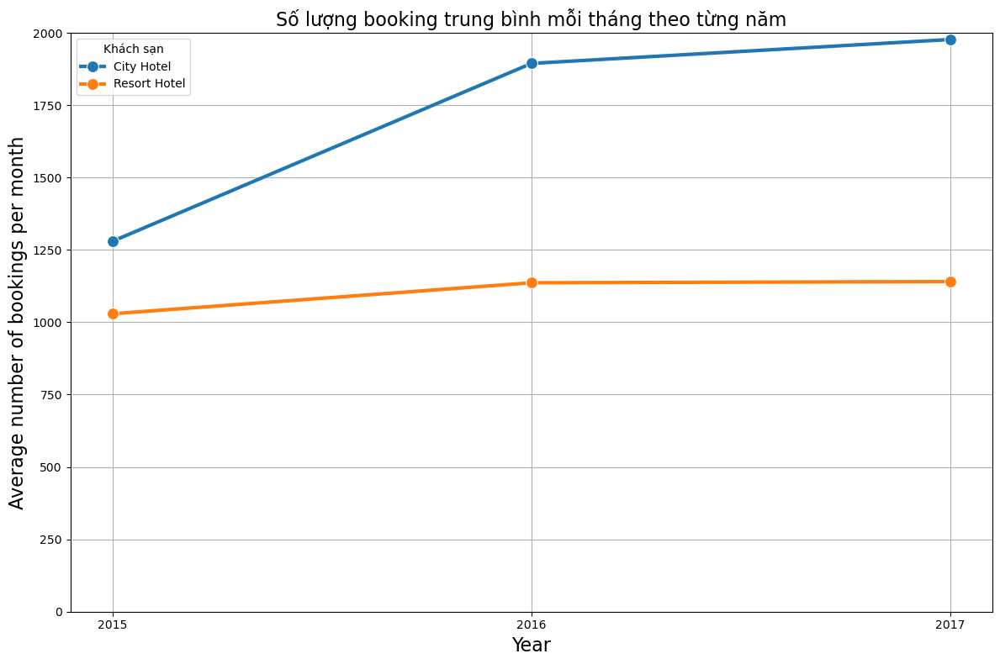

In [24]:
# Tạo DataFrame chứa dữ liệu tổng hợp theo năm
resort_bookings_yearly = booked_rh.groupby("arrival_date_year").count().reset_index()
city_bookings_yearly = booked_ch.groupby("arrival_date_year").count().reset_index()

# Chuẩn hóa dữ liệu
resort_bookings_yearly["hotel"] = resort_bookings_yearly.apply(lambda row: row["hotel"] / 6 if row["arrival_date_year"] == "2015" 
                                                            else (row["hotel"] / 12 if row["arrival_date_year"] == "2016" 
                                                            else (row["hotel"] / 8 if row["arrival_date_year"] == "2017" 
                                                            else row["hotel"])), axis=1)
city_bookings_yearly["hotel"] = city_bookings_yearly.apply(lambda row: row["hotel"] / 6 if row["arrival_date_year"] == "2015" 
                                                        else (row["hotel"] / 12 if row["arrival_date_year"] == "2016" 
                                                        else (row["hotel"] / 8 if row["arrival_date_year"] == "2017" 
                                                        else row["hotel"])), axis=1)

# Tạo biểu đồ đường
plt.figure(figsize=(12, 8))

# Vẽ biểu đồ đường cho City Hotel
sns.lineplot(data=city_bookings_yearly, x="arrival_date_year", y="hotel", label="City Hotel", linewidth=3, marker="o", markersize=10)

# Vẽ biểu đồ đường cho Resort Hotel
sns.lineplot(data=resort_bookings_yearly, x="arrival_date_year", y="hotel", label="Resort Hotel", linewidth=3, marker="o", markersize=10)

plt.title("Số lượng booking trung bình mỗi tháng theo từng năm", fontsize=16)
plt.xlabel("Year", fontsize=16)
plt.ylabel("Average number of bookings per month", fontsize=16)
plt.ylim(0, 2000)

plt.grid(True)
plt.legend(title="Khách sạn")
plt.tight_layout()
plt.show()


Số lượng booking theo tháng của City Hotel và Resort Hotel 

+ Tổng hợp dữ liệu số lượng booking thực tế theo tháng cho cả City Hotel và Resort Hotel

In [25]:
# Đếm số lần mỗi cặp giá trị của arrival_date_month và arrival_date_year xuất hiện
pair_counts = df.groupby(['arrival_date_month', 'arrival_date_year']).size().reset_index(name='count')

# Sắp xếp theo tháng:
ordered_months = ["January", "February", "March", "April", "May", "June", 
                  "July", "August", "September", "October", "November", "December"]

# Sort theo thứ tự thời gian
pair_counts['month_id'] = pd.Categorical(pair_counts['arrival_date_month'], categories=ordered_months, ordered=True)
pair_counts = pair_counts.sort_values(by=['arrival_date_year', 'month_id'])

# Xóa cột biến tạm 'month_id' vì không cần thiết
pair_counts = pair_counts.drop(columns=['month_id'])

# Tổng hợp dữ liệu số lượng booking theo tháng cho cả booked_rh và booked_ch
resort_bookings_monthly = booked_rh.groupby(["arrival_date_year", "arrival_date_month"])["hotel"].count().reset_index()
city_bookings_monthly = booked_ch.groupby(["arrival_date_year", "arrival_date_month"])["hotel"].count().reset_index()

+ Số lượng booking đến theo tháng tại City Hotel

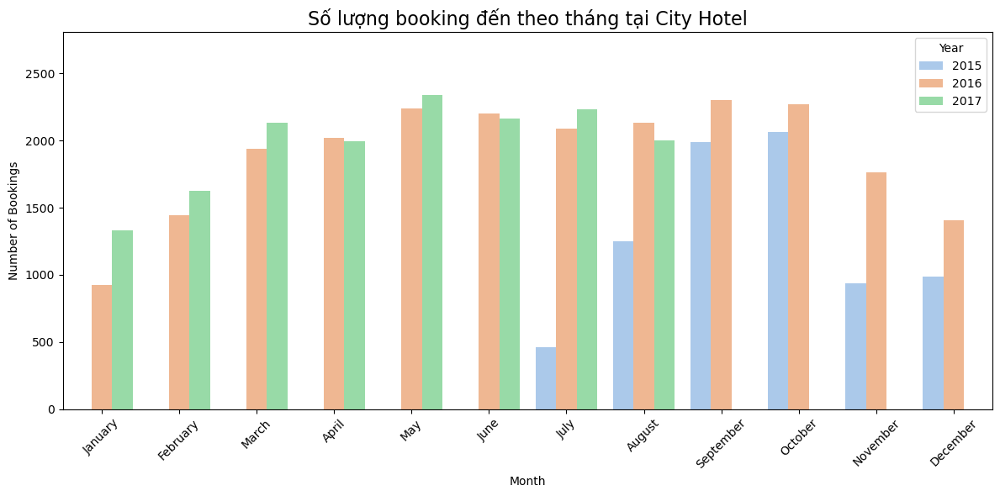

In [26]:
# Tạo biểu đồ cột cho City Hotel
plt.figure(figsize=(12, 6))
sns.barplot(data=city_bookings_monthly, x="arrival_date_month", y="hotel", hue="arrival_date_year", palette="pastel", order=ordered_months)
plt.title("Số lượng booking đến theo tháng tại City Hotel", fontsize=16)
plt.xlabel("Month")
plt.ylabel("Number of Bookings")
plt.legend(title="Year", loc="upper right")
plt.xticks(rotation=45)

# Đặt giới hạn trục y cho biểu đồ City Hotel
max_city_bookings = max(city_bookings_monthly["hotel"])
plt.ylim(0, max_city_bookings * 1.2)

plt.tight_layout()
plt.show()

+ Số lượng booking theo tháng tại Resort Hotel

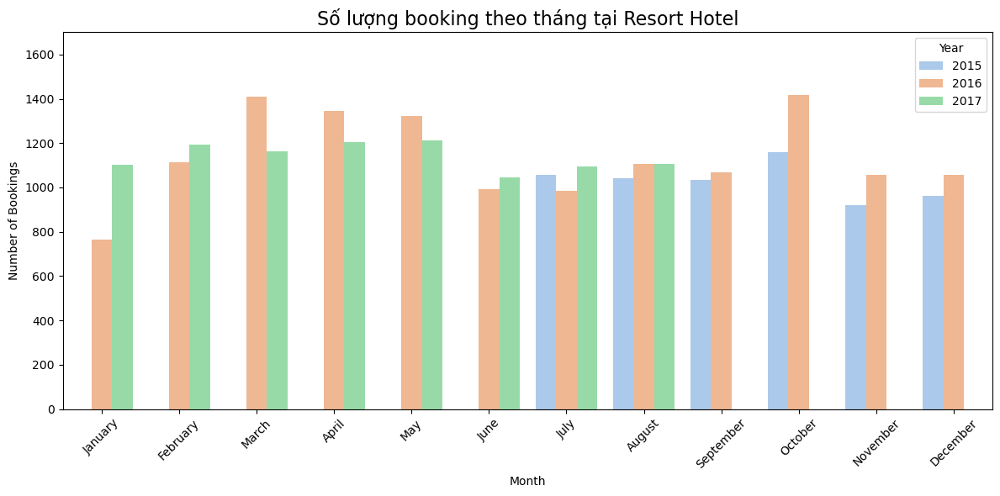

In [27]:
# Tạo biểu đồ cột cho Resort Hotel
plt.figure(figsize=(12, 6))
sns.barplot(data=resort_bookings_monthly, x="arrival_date_month", y="hotel", hue="arrival_date_year", palette="pastel", order=ordered_months)
plt.title("Số lượng booking theo tháng tại Resort Hotel", fontsize=16)
plt.xlabel("Month")
plt.ylabel("Number of Bookings")
plt.legend(title="Year", loc="upper right")
plt.xticks(rotation=45)

# Đặt giới hạn trục y cho biểu đồ Resort Hotel
max_resort_bookings = max(resort_bookings_monthly["hotel"])
plt.ylim(0, max_resort_bookings * 1.2)

plt.tight_layout()
plt.show()

2.8. Cho biết số lượng booking tại hai khách sạn thay đổi như thế nào theo các tháng trong một năm?

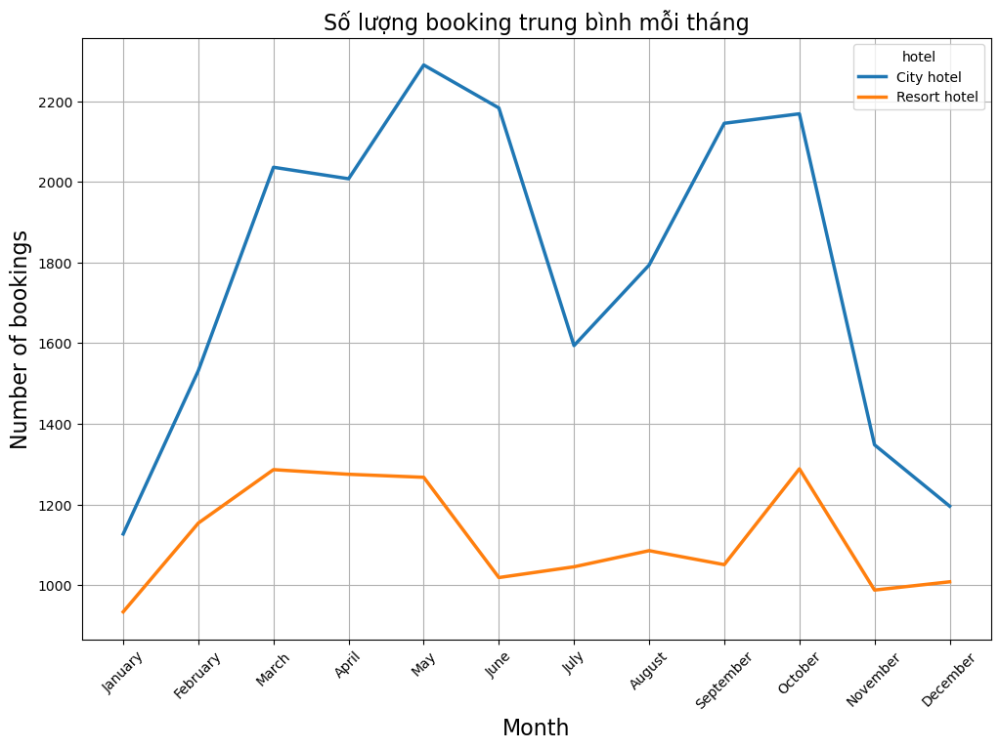

In [28]:
# Tạo DataFrame chứa dữ liệu liên quan:
resort_bookings_monthly = booked_rh.groupby("arrival_date_month")["hotel"].count()
city_bookings_monthly = booked_ch.groupby("arrival_date_month")["hotel"].count()

resort_guest_data = pd.DataFrame({"month": list(resort_bookings_monthly.index),
                                  "hotel": "Resort hotel", 
                                  "bookings": list(resort_bookings_monthly.values)})

city_guest_data = pd.DataFrame({"month": list(city_bookings_monthly.index),
                                "hotel": "City hotel", 
                                "bookings": list(city_bookings_monthly.values)})
full_guest_data = pd.concat([resort_guest_data, city_guest_data], ignore_index=True)


full_guest_data["month"] = pd.Categorical(full_guest_data["month"], categories=ordered_months, ordered=True)

# Chuẩn hóa dữ liệu:
full_guest_data.loc[(full_guest_data["month"] == "July") | (full_guest_data["month"] == "August"), "bookings"] /= 3
full_guest_data.loc[~((full_guest_data["month"] == "July") | (full_guest_data["month"] == "August")), "bookings"] /= 2

# Hiển thị biểu đồ:
plt.figure(figsize=(12, 8))
sns.lineplot(x="month", y="bookings", hue="hotel", data=full_guest_data, 
             hue_order=["City hotel", "Resort hotel"], size="hotel", sizes=(2.5, 2.5))
plt.title("Số lượng booking trung bình mỗi tháng", fontsize=16)
plt.xlabel("Month", fontsize=16)
plt.xticks(rotation=45)
plt.ylabel("Number of bookings", fontsize=16)
plt.grid(True)
plt.show()

- Tại City hotel, số lượng booking có sự biến động mạnh theo các tháng trong năm, đạt thấp nhất là trong các tháng thời tiết lạnh từ tháng 11 đến tháng 1 với khoảng 1100 - 1400 bookings / tháng, đạt cao nhất là trong 2 giai đoạn từ tháng 3 - tháng 6 và tháng 9 - 10 với khoảng 2000 - 2300 bookings / tháng.

- Tại Resort hotel, số lượng booking tương đối ổn định theo các tháng trong năm, đạt thấp nhất là trong các tháng thời tiết lạnh từ tháng 11 đến tháng 1 với khoảng 1000 bookings / tháng, đạt cao nhất là trong 2 giai đoạn từ tháng 3 - tháng 5 và tháng 10 với khoảng 1200 - 1300 bookings / tháng.

=> Ở cả City hotel và Resort hotel đều có số lượng khách cao nhất vào hai giai đoạn từ tháng 3 - tháng 5 và thấp nhất vào giai đoạn từ tháng 11 - tháng 1, điều này có được là do hai khách sạn này cùng ở Bồ Đào Nha, nhu cầu cho việc du lịch trong các khoảng thời gian của cùng 1 năm ở hai khách sạn là tương đồng.

##### 3. Phân tích phân phối đối với biến num

3.1. Cho biết phân phối của lead time - thời gian từ lúc khách đặt phòng đến lúc khách đến 2 khách sạn khác nhau như thế nào?

- Ở cả hai khách sạn, phân phối của lead time có dạng đồ thị tương dối giống nhau. Khác biệt ở chỗ thời gian lead time ở City hotel lệch về phía bên trái nhiều hơn nhưng lại trải trên một khoảng giá trị rộng hơn. City hotel có giá trị trung bình lead time cao hơn một chút so với Resort hotel (80.70 so với 78.84). 

=> Thời gian lead time (số lượng ngày kể từ ngày xác nhận đặt phòng đến ngày nhận phòng) ở mức cao và gần như ngang bằng nhau ở cả 2 khách sạn khi xét chỉ những lượt đặt phòng không bị hủy, những phân tích chi tiết vào lead time có thể giúp phát triển chiến lược của khách sạn. 

3.2. Cho biết phân phối của adr - giá mỗi đêm tại khách sạn có khác biệt gì giữa 2 khách sạn hay không?

- Ở cả hai khách sạn, phân phối của adr có dạng đồ thị tương dối giống nhau, đều bị lệch về phía bên trái và miền giá trị trải trên một khoảng rộng. Khác biệt ở chỗ City hotel bị lệch về phía bên trái ít hơn so với Resort hotel và có giá trị trung bình adr cao hơn tương đối nhiều so với Resort hotel (105.75 so với 90.79). 

=> Mức giá phòng mỗi đêm (adr) ở cả hai khách sạn đều lệch về phía bên trái với giá trị median nhỏ hơn giá trị mean. Điều này cho thấy khách hàng đến hai khách sạn này sử dụng dịch vụ ở mức phổ thông là chủ yếu. Ở Resort hotel có miền giá trị bị lệch nhiều hơn vì với dạng khách sạn Resort sẽ có tỉ lệ cao hơn của những khách hàng muốn trải nghiệm dịch vụ nghỉ dưỡng cao cấp với giá đắt tiền gấp 3 - 4 lần mức trung bình.

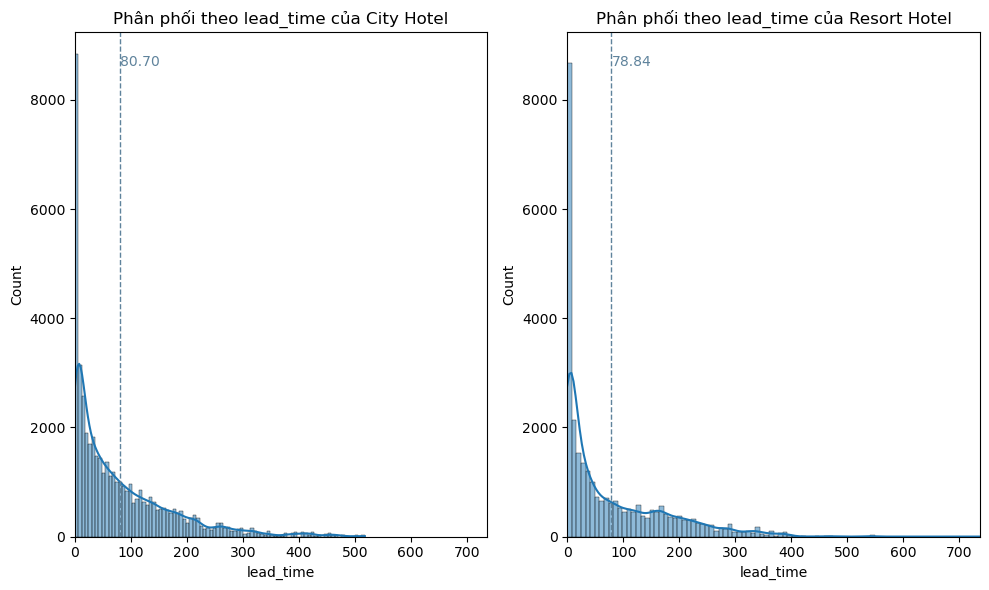

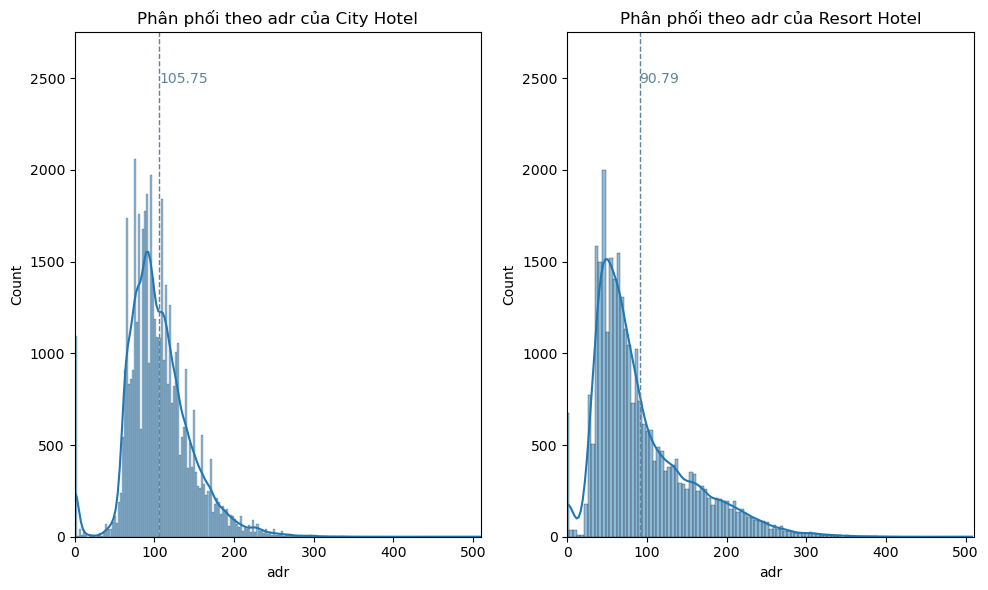

In [29]:
# Chỉ vẽ cho 2 cột lead_time và adr
for col in ['lead_time', 'adr']:
    # Tạo figure với 2 subplot
    fig, axes = plt.subplots(1, 2, figsize=(10, 6))
    
    max_value_x = max(booked_rh[col].max(), booked_ch[col].max())
    max_value_y = max(booked_rh[col].value_counts().max(), booked_ch[col].value_counts().max())

    # Vẽ histogram kết hợp với đường KDE cho City Hotel
    sns.histplot(data=booked_ch, x=col, ax=axes[0], kde=True)
    axes[0].set_title(f'Phân phối theo {col} của City Hotel')
    axes[0].set_xlabel(col)
    axes[0].set_ylabel('Count')
    if col == 'lead_time':
        axes[0].set_ylim(0, max_value_y * 3)  # Đặt giới hạn trục y
        # Vẽ đường dọc chỉ rõ giá trị trung bình của 'lead_time'
        mean_lead_time_ch = booked_ch['lead_time'].mean()
        axes[0].axvline(x=mean_lead_time_ch, color='#5f839c', linestyle='--', linewidth=1)
        axes[0].text(mean_lead_time_ch, max_value_y * 2.8, f'{ mean_lead_time_ch:.2f}', color='#5f839c')
    else:
        axes[0].set_ylim(0, max_value_y * 2)  # Đặt giới hạn trục y
        # Vẽ đường dọc chỉ rõ giá trị trung bình của 'adr'
        mean_adr_ch = booked_ch['adr'].mean()
        axes[0].axvline(x=mean_adr_ch, color='#5f839c', linestyle='--', linewidth=1)
        axes[0].text(mean_adr_ch, max_value_y * 1.8, f'{ mean_adr_ch:.2f}', color='#5f839c')
    axes[0].set_xlim(0, max_value_x)  # Đặt giới hạn trục Ox

    # Vẽ histogram kết hợp với đường KDE cho Resort Hotel
    sns.histplot(data=booked_rh, x=col, ax=axes[1], kde=True)
    axes[1].set_title(f'Phân phối theo {col} của Resort Hotel')
    axes[1].set_xlabel(col)
    axes[1].set_ylabel('Count')
    if col == 'lead_time':
        axes[1].set_ylim(0, max_value_y * 3)  # Đặt giới hạn trục y
        # Vẽ đường dọc chỉ rõ giá trị trung bình của 'lead_time'
        mean_lead_time_rh = booked_rh['lead_time'].mean()
        axes[1].axvline(x=mean_lead_time_rh, color='#5f839c', linestyle='--', linewidth=1)
        axes[1].text(mean_lead_time_rh, max_value_y * 2.8, f'{ mean_lead_time_rh:.2f}', color='#5f839c')
    else:
        axes[1].set_ylim(0, max_value_y * 2)  # Đặt giới hạn trục y
        # Vẽ đường dọc chỉ rõ giá trị trung bình của 'adr'
        mean_adr_rh = booked_rh['adr'].mean()
        axes[1].axvline(x=mean_adr_rh, color='#5f839c', linestyle='--', linewidth=1)
        axes[1].text(mean_adr_rh, max_value_y * 1.8, f'{ mean_adr_rh:.2f}', color='#5f839c')
    axes[1].set_xlim(0, max_value_x)  # Đặt giới hạn trục Ox
    
    plt.tight_layout()
    plt.show()


### IV. EDA 2D

##### 1. Phân tích hệ số tương quan giữa các biến num

1.1. Có giá trị thuộc tính số nào của việc booking có sự tương quan đáng chú ý với nhau hay không?

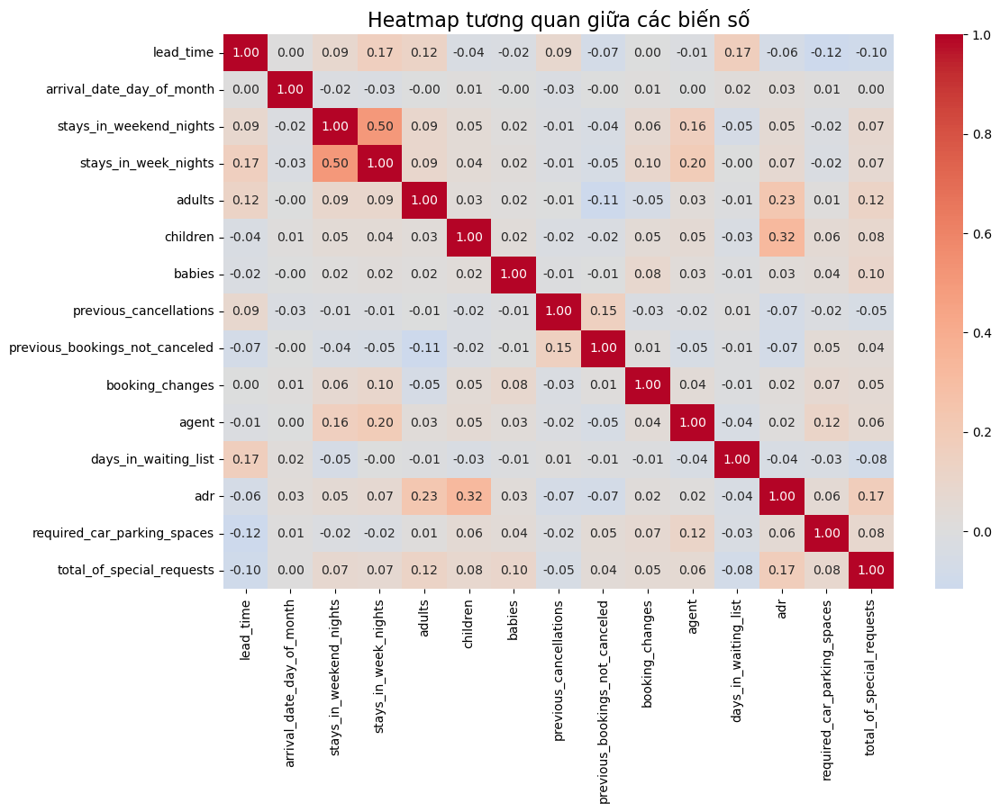

In [30]:
plt.figure(figsize=(12, 8))
sns.heatmap(df.select_dtypes(include=['number']).corr(), annot=True, fmt=".2f", cmap="coolwarm", center=0)
plt.title('Heatmap tương quan giữa các biến số', fontsize=16)
plt.show()

- Mức độ tương quan giữa các biến thuộc tính số nằm trong khoảng [-0.12; 0.5]. 
    
- Giá trị tương quan nghịch đáng chú ý nhất là giữa 2 biến: 'lead time' và 'required car parking spaces' với -0.12, cho thấy lead time cao có thể khiến số lượng không gian đỗ xe giảm.

=> Chưa thể đưa ra những kết luận rõ ràng, cần thêm những sự phân tích khác. Giả thuyết: Lead time cao có thể làm tăng việc hủy phòng dẫn đến việc số lượng không gian đỗ xe yêu cầu xuất hiện nhiều giá trị '0' hơn nên trung bình không gian đỗ xe yêu cầu của các booking sẽ giảm.

- Các giá trị tương quan thuận đáng chú ý nhất là giữa các biến: 'children' và 'adr' với 0.32, 'adults' và 'adr' với 0.23.

=> Giá của một booking có sự tỉ lệ thuận với của số lượng người lớn và trẻ em. Trung bình một trẻ em sẽ làm tăng giá booking lên nhiều hơn so với một người lớn.

##### 2. Sử dụng Scatter plot để phân tích dữ liệu 2D

2.1. Yếu tố lead time và giá phòng tác động đến việc một phòng bị hủy như thế nào?

In [31]:
# Chuyển đổi kiểu dữ liệu của cột 'is_canceled' sang số nguyên
clone_df['is_canceled'] = clone_df['is_canceled'].astype(int)

# Nhóm dữ liệu theo 'lead_time':
lead_cancel_data = clone_df.groupby("lead_time")["is_canceled"].describe()

# sử dụng chỉ các lead_times có nhiều hơn 10 đặt phòng để vẽ đồ thị:
lead_cancel_data_10 = lead_cancel_data.loc[lead_cancel_data["count"] >= 10]

In [32]:
# Nhóm dữ liệu theo 'adr':
adr_cancel_data = clone_df.groupby("adr")["is_canceled"].describe()

# Đặt lại index của DataFrame adr_cancel_data để sử dụng trong việc vẽ đồ thị
adr_cancel_data_reset = adr_cancel_data.reset_index()

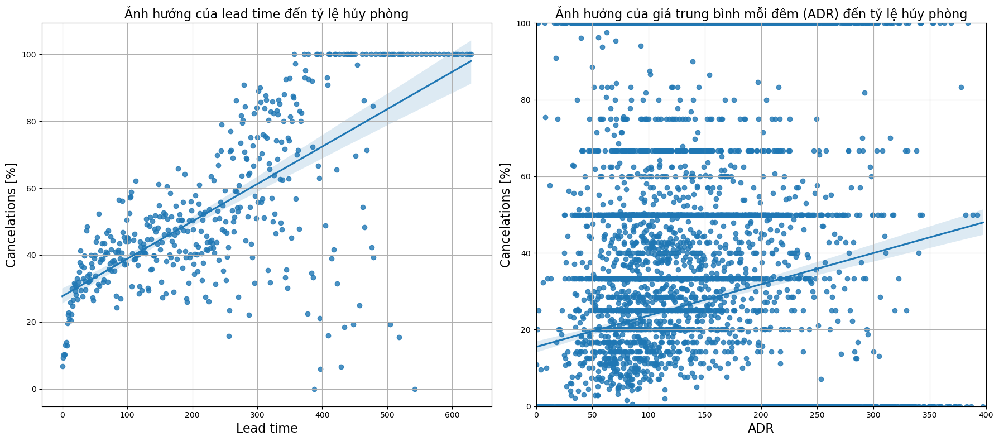

In [33]:
# Tạo figure với 2 subplot
fig, axes = plt.subplots(1, 2, figsize=(18, 8))

# Biểu đồ cho Lead Time và Tỷ lệ hủy phòng
plt.sca(axes[0])  # Chọn subplot bên trái
lead_cancel_data_10 = lead_cancel_data_10.reset_index()  # Đặt lại index để vẽ đồ thị
sns.regplot(x=lead_cancel_data_10["lead_time"], y=lead_cancel_data_10["mean"] * 100, ax=axes[0])
axes[0].set_title("Ảnh hưởng của lead time đến tỷ lệ hủy phòng", fontsize=16)
axes[0].set_xlabel("Lead time", fontsize=16)
axes[0].set_ylabel("Cancelations [%]", fontsize=16)
axes[0].grid(True)

# Biểu đồ cho ADR và Tỷ lệ hủy phòng
plt.sca(axes[1])  # Chọn subplot bên phải
adr_cancel_data_reset = adr_cancel_data_reset[adr_cancel_data_reset["adr"] <= 400]  # Giới hạn giá trị ADR
sns.regplot(x=adr_cancel_data_reset["adr"], y=adr_cancel_data_reset["mean"] * 100, ax=axes[1])
axes[1].set_title("Ảnh hưởng của giá trung bình mỗi đêm (ADR) đến tỷ lệ hủy phòng", fontsize=16)
axes[1].set_xlabel("ADR", fontsize=16)
axes[1].set_ylabel("Cancelations [%]", fontsize=16)
axes[1].set_xlim(0, 400)  # Đặt giới hạn cho trục x
axes[1].set_ylim(0, 100)   # Đặt giới hạn cho trục y
axes[1].grid(True)

plt.tight_layout()
plt.show()

- Yếu tố lead time có ảnh hưởng lớn đến tỉ lệ hủy phòng, thời gian lead time càng cao thì tỉ lệ hủy phòng của booking đó càng cao. Lead time tăng thêm 10 ngày thì tỉ lệ hủy phòng sẽ tăng lên khoảng 1\%.

- Yếu tố adr - mức giá phòng mỗi đêm có ảnh hưởng khá cao đến tỉ lệ hủy phòng, adr càng cao thì tỉ lệ hủy phòng của booking đó càng cao. Giá phòng tăng thêm 20 Euro thì tỉ lệ hủy phòng sẽ tăng lên khoảng 1\%.

=> Thời gian lead time tỉ lệ thuận với tỉ lệ hủy phòng là do người đặt phòng đó đã hủy phòng nhưng không gửi lại xác nhận cho khách sạn. Mức giá phòng cao làm tăng tỉ lệ hủy phòng do trong thời gian lead time thì người đặt phòng có thể tìm được những lựa chọn tốt hơn về giá.

##### 3. Sử dụng bar chart để phân tích dữ liệu num và cate

3.1. Giá tại hai khách sạn thay đổi như thế nào qua từng tháng trong một năm?

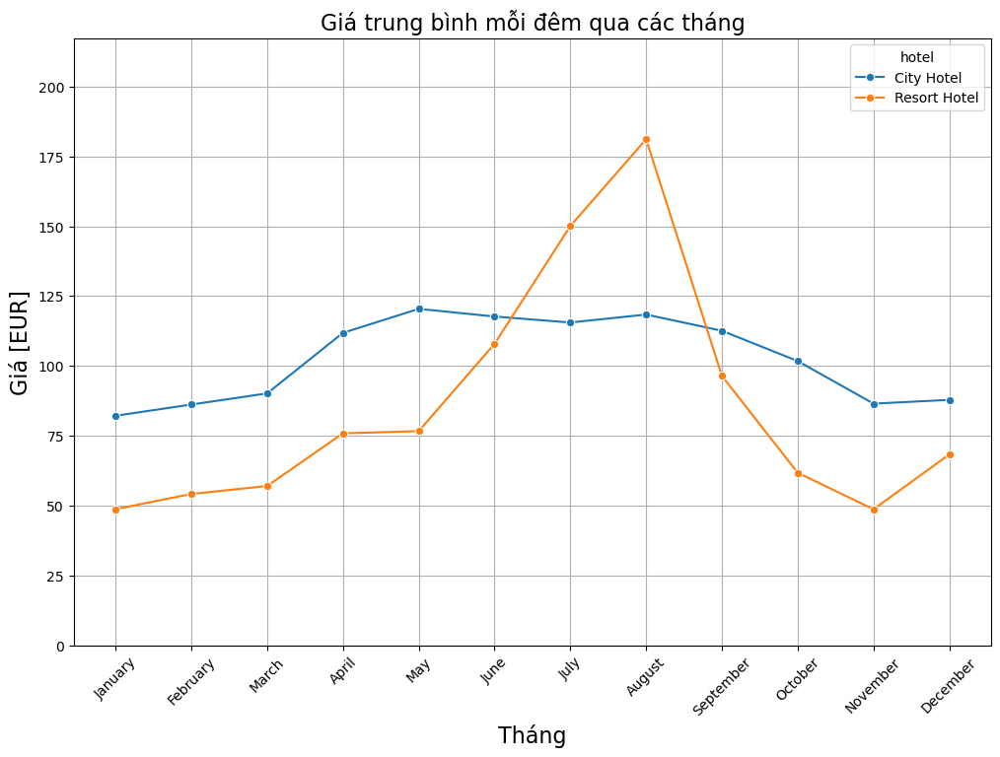

In [34]:
# Tính giá trung bình mỗi đêm cho mỗi phòng qua 12 tháng trong năm cho Resort Hotel
resort_prices_monthly = booked_rh.groupby(["arrival_date_month"])["adr"].mean().reset_index()

# Tính giá trung bình mỗi đêm cho mỗi phòng qua 12 tháng trong năm cho City Hotel
city_prices_monthly = booked_ch.groupby(["arrival_date_month"])["adr"].mean().reset_index()

# Tạo DataFrame chứa dữ liệu
full_data_bookings = pd.concat([resort_prices_monthly.assign(hotel="Resort Hotel"), 
                              city_prices_monthly.assign(hotel="City Hotel")], ignore_index=True)

# Sắp xếp theo tháng
ordered_months = ["January", "February", "March", "April", "May", "June", 
                  "July", "August", "September", "October", "November", "December"]
full_data_bookings["arrival_date_month"] = pd.Categorical(full_data_bookings["arrival_date_month"], 
                                                        categories=ordered_months, ordered=True)

# Tìm giá trị tối đa của dữ liệu
max_y = full_data_bookings["adr"].max()

# Vẽ biểu đồ
plt.figure(figsize=(12, 8))
sns.lineplot(x="arrival_date_month", y="adr", hue="hotel", data=full_data_bookings, 
             hue_order=["City Hotel", "Resort Hotel"], marker="o")  
plt.title("Giá trung bình mỗi đêm qua các tháng", fontsize=16)
plt.xlabel("Tháng", fontsize=16)
plt.xticks(rotation=45)
plt.ylabel("Giá [EUR]", fontsize=16)
plt.ylim(0, max_y * 1.2)  # Đặt giới hạn dưới của trục Oy từ 0 đến max_y
plt.grid(True)
plt.show()


- Tại City hotel, mức giá phòng trung bình cho mỗi đêm (mean adr) duy trì ở mức ổn định trong một năm, đạt thấp nhất là trong các tháng thời tiết lạnh từ tháng 10 đến tháng 3 với trung bình từ 80 - 100 euro / tháng, đạt cao nhất là trong giai đoạn thời tiết nóng từ tháng 4 - tháng 9 với trung bình từ 110 - 125 euro / tháng.

- Tại Resort hotel, mức giá phòng trung bình cho mỗi đêm (mean adr) có biến động lớn trong một năm, đạt thấp nhất là trong các tháng thời tiết lạnh từ tháng 10 đến tháng 5 với trung bình từ 50 - 75 euro / tháng, đạt cao nhất là trong giai đoạn thời tiết nóng từ tháng 6 - tháng 9 với trung bình từ 95 - 180 euro / tháng.

=> Ở cả City hotel và Resort hotel đều có mức giá cao nhất vào hai giai đoạn từ tháng 6 - tháng 9 và thấp nhất vào giai đoạn từ tháng 10 - tháng 3, vào những mùa thời tiết nóng, hai khách sạn có xu hướng tăng giá để tối ưu hóa doanh thu mặc dù điều này làm cho số lượng khách đến hai khách sạn này giảm.

=> Biến động về giá của Resort hotel lớn hơn với City hotel vì mô hình kinh hoanh ở một Resort hotel nghỉ dưỡng sẽ đạt được doanh cao vào các tháng mùa hè chứ không ổn định như ở City hotel nên mới có sự tăng giá đột biến này.

3.2. Liệu có hay không việc khách có xu hướng đến khách sạn vào dịp cuối tuần hơn là các ngày trong tuần tại hai loại khách sạn?

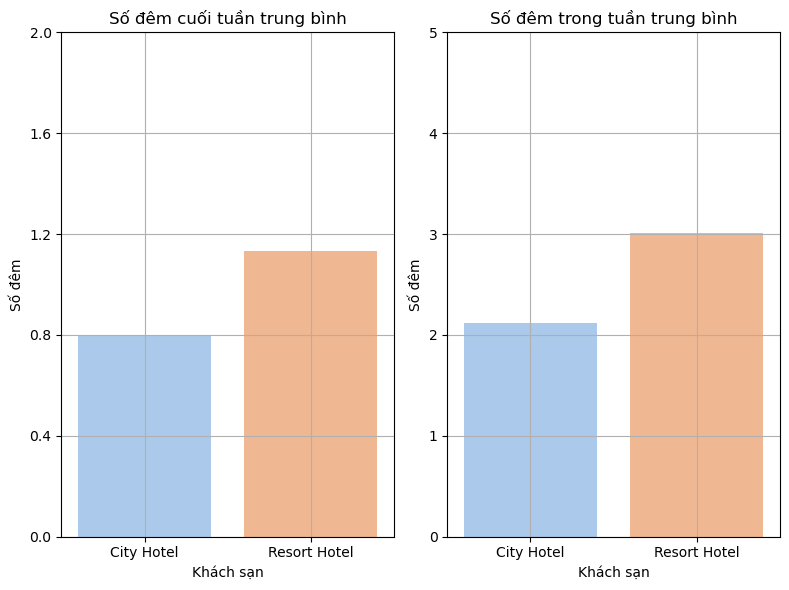

In [35]:
# Tính giá trị trung bình của stays_in_weekend_nights và stays_in_week_nights cho booked_ch và booked_rh
ch_weekend_avg = booked_ch["stays_in_weekend_nights"].mean()
ch_week_avg = booked_ch["stays_in_week_nights"].mean()

rh_weekend_avg = booked_rh["stays_in_weekend_nights"].mean()
rh_week_avg = booked_rh["stays_in_week_nights"].mean()

# Tạo DataFrame chứa dữ liệu trung bình
avg_data = pd.DataFrame({
    "Hotel": ["City Hotel", "Resort Hotel"],
    "Weekend Nights": [ch_weekend_avg, rh_weekend_avg],
    "Week Nights": [ch_week_avg, rh_week_avg]
})

# Vẽ biểu đồ
# Tạo figure với 2 subplot
fig, axes = plt.subplots(1, 2, figsize=(8, 6))

# Vẽ biểu đồ cột cho số đêm cuối tuần trung bình
sns.barplot(data=avg_data, x="Hotel", y="Weekend Nights", hue="Hotel", ax=axes[0], palette="pastel", dodge=False)
axes[0].set_title("Số đêm cuối tuần trung bình")
axes[0].set_xlabel("Khách sạn")
axes[0].set_ylabel("Số đêm")
axes[0].set_ylim(0, 2)
axes[0].set_yticks(np.arange(0, 2.1, 0.4))
axes[0].grid(True)

# Vẽ biểu đồ cột cho số đêm trong tuần trung bình
sns.barplot(data=avg_data, x="Hotel", y="Week Nights", hue="Hotel", ax=axes[1], palette="pastel", dodge=False)
axes[1].set_title("Số đêm trong tuần trung bình")
axes[1].set_xlabel("Khách sạn")
axes[1].set_ylabel("Số đêm")
axes[1].set_ylim(0, 5)
axes[1].grid(True)

plt.tight_layout()
plt.show()

- Tại cả hai khách sạn đều không cho thấy xu hướng số lượng đặt phòng vào cuối tuần cao hơn số lượng đặt phòng vào các ngày trong tuần. 
    
=> Kết quả cho thấy điều ngược lại, nếu tính theo trung bình thời gian trong tuần (một tuần có 7 ngày gồm 2 ngày cuối tuần và 5 ngày trong tuần) thì lại cho thấy được xu hướng đến hai khách sạn vào các ngày trong tuần cao hơn một lượng nhỏ.


3.3. Giá đặt phòng mỗi đêm có sự khác biệt lớn hay không giữa các loại phòng khác nhau và các phân khúc thị trường khác nhau?

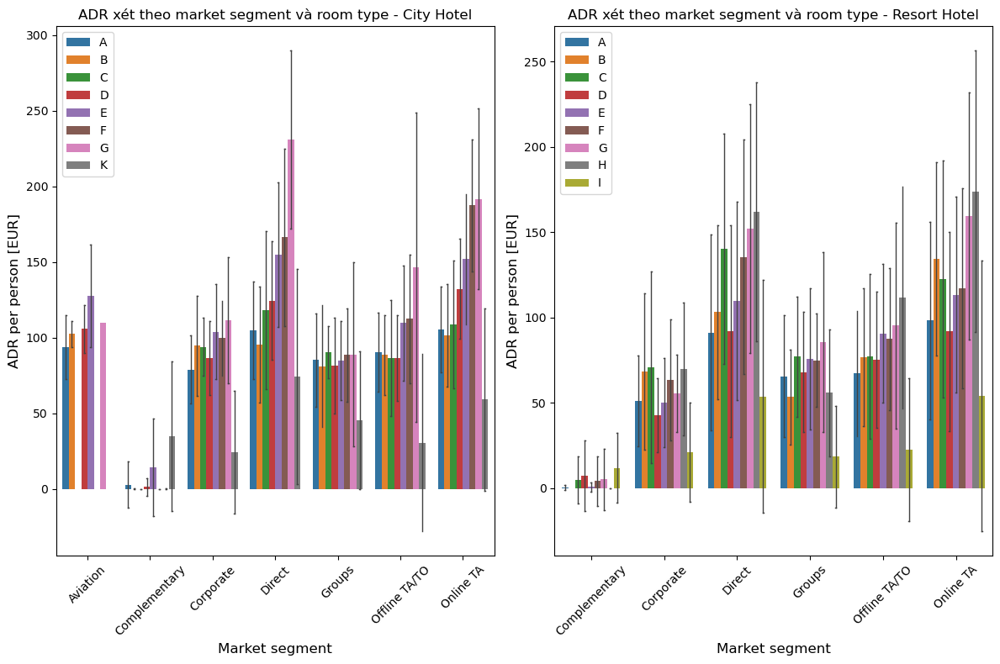

In [36]:
# Sắp xếp dữ liệu theo thứ tự bảng chữ cái cho cột "assigned_room_type"
booked_rh_sorted_room_type = booked_rh.sort_values(by="assigned_room_type")
booked_ch_sorted_room_type = booked_ch.sort_values(by="assigned_room_type")

# Tạo figure với 2 subplot
fig, axes = plt.subplots(1, 2, figsize=(12, 8))

# Biểu đồ cho City Hotel
sns.barplot(x="market_segment",
            y="adr",
            hue="assigned_room_type",
            data=booked_ch_sorted_room_type,
            order=sorted(booked_ch_sorted_room_type["market_segment"].unique()),  # Sắp xếp theo thứ tự bảng chữ cái
            errorbar='sd',  # Thay thế cho ci="sd"
            err_kws={'linewidth': 1},  # Thay thế cho errwidth=1
            capsize=0.1,
            ax=axes[0])
axes[0].set_title("ADR xét theo market segment và room type - City Hotel", fontsize=12)
axes[0].set_xlabel("Market segment", fontsize=12)
axes[0].set_ylabel("ADR per person [EUR]", fontsize=12)
axes[0].legend(loc="upper left")
axes[0].tick_params(axis='x', rotation=45)

# Biểu đồ cho Resort Hotel
sns.barplot(x="market_segment",
            y="adr",
            hue="assigned_room_type",
            data=booked_rh_sorted_room_type,
            order=sorted(booked_rh_sorted_room_type["market_segment"].unique()),  # Sắp xếp theo thứ tự bảng chữ cái
            errorbar='sd',  # Thay thế cho ci="sd"
            err_kws={'linewidth': 1},  # Thay thế cho errwidth=1
            capsize=0.1,
            ax=axes[1])
axes[1].set_title("ADR xét theo market segment và room type - Resort Hotel", fontsize=12)
axes[1].set_xlabel("Market segment", fontsize=12)
axes[1].set_ylabel("ADR per person [EUR]", fontsize=12)
axes[1].legend(loc="upper left")
axes[1].tick_params(axis='x', rotation=45)

plt.tight_layout()
plt.show()


- Các loại phòng khác nhau:
    
    + Tại City hotel với 8 loại phòng khác nhau và Resort hotel với 9 loại phòng khác nhau (các loại phòng đều đã bị mã hóa thành các nhãn không phân cấp cho việc bảo mật thông tin), dựa theo mức độ chênh lệch về giá giữa các loại phòng có thể chia được các loại phòng trên thành 3 phân khúc giá.

- Các phân khúc thị trường khác nhau:

    + Theo phân khúc thị trường thì có thể thấy rõ được sự chênh lệch về giá theo từng phân khúc và tương đồng nhau ở cả hai loại khách sạn với thứ tự từ đăt nhất đến rẻ nhất là: Direct, Online TA, Aviation (Chỉ có tại city hotel), Offline TA/TO, Group, Corporate, Complementary.

=> Hai khách sạn này đều có sự phân chia giá khác nhau cho các phòng nhằm mục đích đáp ứng được nhu cầu và tài chính của khách hàng. Mức giá đặt trực tiếp thường là đặt với không ưu đãi và thời gian ngay lập tức nên sẽ có mức giá cao, việc đặt Offline TA/TO có thể nhận được tư vấn và ưu đãi tốt hơn so với Online TA. Tiếp theo, khi đặt qua các dạng dịch vụ với những gói lớn và nhiều phòng cùng lúc như Aviation, Group, Corporate thì cũng sẽ giúp tiết kiệm đáng kể chi phí so với khi đặt cá nhân. Cuối cùng, rẻ nhất là đặt với hình thức Complementary thường liên quan đến những ưu đãi đặc biệt của hotel cho một lượng khách hàng đặc biệt với số lượng rất nhỏ.

##### 4. Tính tỷ trọng đối với hai biến cate

4.1. Các yếu tố phân khúc thị trường của khách hàng, loại tệp khách hàng và việc khách hàng đó có phải là khách lần đầu hay không ảnh hưởng như thế nào đến khả năng phòng đã được đặt bị hủy?

Tính tỷ trọng cho từng cặp giá trị của cột 'is_canceled' và một cột cate khác

In [37]:
# Khởi tạo DataFrame để lưu kết quả
result_dfs = {}

# Duyệt qua từng cột trong danh sách categorical_cols
for col in categorical_cols:
    # Chỉ xử lý các cột 'market_segment', 'customer_type', 'is_repeated_guest'
    if col not in ['market_segment', 'customer_type', 'is_repeated_guest']:
        continue

    # Gom nhóm dữ liệu và tính toán tỷ trọng cho từng cặp giá trị của cột 'hotel' và cột hiện tại
    grouped_data = df.groupby(['is_canceled', col]).describe()['adr']

    # Tính tỷ trọng: count / tổng số dòng
    grouped_data['weight'] = grouped_data['count'] / len(df)

    # Lưu kết quả vào result_dfs
    result_dfs[col] = grouped_data

+ Hiển thị kết quả cho cột 'market_segment'

In [38]:
result_dfs['market_segment']

count        mean        std    min    25%  \
is_canceled market_segment                                                 
0           Aviation          185.0   99.482054  22.237159   0.00  95.00   
            Complementary     646.0    3.078545  14.623103   0.00   0.00   
            Corporate        4303.0   67.105399  31.430982   0.00  42.00   
            Direct          10672.0  113.875200  58.625082   0.00  74.86   
            Groups           7714.0   77.124541  34.887721  -6.38  61.00   
            Offline TA/TO   15908.0   83.421750  34.873871   0.00  63.75   
            Online TA       35738.0  113.863099  48.496358   0.00  81.73   
1           Aviation           52.0  102.490385  20.179462   0.00  95.00   
            Complementary      97.0    1.606495   9.182433   0.00   0.00   
            Corporate         992.0   79.134194  31.422717   0.00  62.00   
            Direct           1934.0  124.108454  62.098369   0.00  81.00   
            Groups          12097.0   80.981161  30.836759   0.00  62.00   
            Offline TA/TO    8311.0   94.882960  65.509702   0.00  75.00   
            Online TA       20739.0  122.942238  48.937472   0.00  89.10   
            Undefined           2.0   15.000000   4.242641  12.00  13.50   

                               50%       75%     max    weight  
is_canceled market_segment                                      
0           Aviation         95.00  110.0000   193.5  0.001550  
            Complementary     0.00    0.0000   170.0  0.005411  
            Corporate        65.00   81.7500   508.0  0.036042  
            Direct          103.68  148.2225   451.5  0.089388  
            Groups           72.00   90.0000   367.0  0.064612  
            Offline TA/TO    80.75  104.9800   510.0  0.133244  
            Online TA       107.10  139.9975   402.0  0.299338  
1           Aviation        106.75  110.0000   144.0  0.000436  
            Complementary     0.00    0.0000    79.0  0.000812  
            Corporate        79.00  100.0000   315.0  0.008309  
            Direct          114.00  160.0000   437.0  0.016199  
            Groups           70.00   95.0000   340.0  0.101323  
            Offline TA/TO    90.00  110.0000  5400.0  0.069612  
            Online TA       116.10  148.5000   450.0  0.173708  
            Undefined        15.00   16.5000    18.0  0.000017

+ Hiển thị kết quả cho cột 'customer_type'

In [39]:
result_dfs['customer_type']

count        mean        std   min    25%  \
is_canceled customer_type                                                  
0           Contract          2814.0   91.469151  35.139794  0.00  66.49   
            Group              518.0   82.450058  45.098526  0.00  55.00   
            Transient        53099.0  104.776033  52.243528  0.00  70.03   
            Transient-Party  18735.0   88.180894  38.901806 -6.38  65.00   
1           Contract          1262.0   78.809929  28.320709  0.00  62.00   
            Group               59.0   92.606441  82.865812  0.00   0.00   
            Transient        36514.0  110.267542  54.736246  0.00  77.50   
            Transient-Party   6389.0   79.936098  29.380380  0.00  62.00   

                                50%       75%      max    weight  
is_canceled customer_type                                         
0           Contract          90.00  113.0000   229.25  0.023570  
            Group             74.76  105.0000   270.00  0.004339  
            Transient         97.00  133.5000   510.00  0.444752  
            Transient-Party   85.00  109.0000   451.50  0.156923  
1           Contract          62.00   94.5000   250.00  0.010570  
            Group             91.00  141.0000   318.00  0.000494  
            Transient        100.30  132.3825  5400.00  0.305838  
            Transient-Party   75.00   99.6300   340.00  0.053514

+ Hiển thị kết quả cho cột 'is_repeated_guest'

In [40]:
result_dfs['is_repeated_guest']

count        mean        std   min    25%  \
is_canceled is_repeated_guest                                                
0           0                  71908.0  101.670375  48.614712  0.00  70.00   
            1                   3258.0   62.848877  47.511289 -6.38  35.10   
1           0                  43672.0  105.357324  52.653428  0.00  73.95   
            1                    552.0   73.872482  33.193191  0.00  62.80   

                                  50%       75%     max    weight  
is_canceled is_repeated_guest                                      
0           0                  94.500  126.0000   510.0  0.602295  
            1                  65.000   80.0000   508.0  0.027289  
1           0                  96.905  128.2825  5400.0  0.365793  
            1                  65.000   90.0000   300.0  0.004624

- Yếu tố phân khúc thị trường của khách hàng (market segment):

    + Việc đặt qua hình thức Group có khả năng bị hủy cao nhất với khoảng 60\%, tiếp theo là hình thức Online TA với khoảng hơn 35\%, Offline TA/TO với khoảng gần 35\%, các hình thức còn lại có khả năng bị hủy rất thấp.

=> Lí do cho việc này là việc đặt với hình thức Group có thể dẫn đến việc hủy khi có vấn đề cá nhân hoặc tập thể trong nhóm đó, ngoài ra việc đặt qua TA hoặc TA/TO là không thông qua trực tiếp với người quản lý khách sạn nên dễ phát sinh ra nhiều vấn đề khác làm thay đổi kế hoạch đặt phòng.

- Yếu tố loại tệp khách hàng (customer type):

    + Việc đặt qua hình thức Transient có khả năng bị hủy cao nhất với khoảng 41\%, tiếp theo là hình thức Contract với khoảng 33\%, Transient-Party với khoảng 25\% và Group với khoảng 10\%. 

=> Lí do cho việc này là khi khách càng có ít ràng buộc với một bên nào đó thì tỉ lệ hủy của khách đó sẽ cao hơn, với hình thức Transient có nghĩa là tạm thời, không liên quan đến bất kì bên nào thì khách có thể hủy một booking nhanh chóng và dễ dàng.

- Yếu tố khách hàng lần đầu đặt booking tại hotel:

    + Khách hàng lần đầu đặt booking tại hotel có tỉ lệ hủy cao hơn nhiều so với khách hàng đã từng đặt booking tại hotel đó (38\% và 12\%).

=> Điều này tương đối dễ hiểu vì khi một khách hàng booking một phòng của một hotel đã đến thì người đó sẽ không còn cân nhắc hay có lo ngại gì về trải nghiệm tại hotel đó nữa, trong khi người mới booking hotel đó lần đầu có thể sẽ phân vân và tìm những hotel khác để có trải nghiệm và giá thành tốt hơn dẫn đến khả năng người đó hủy cao hơn.

### V. EDA 3D

##### 1. Sử dụng Scatter plot để phân tích dữ liệu 3D cho ba biến num

1.1 Thời gian nào trong năm số lượng khách đặt phòng ở hai khách sạn cao nhất? Số lượng khách trong mỗi lượt đặt phòng thay đổi thế nào trong năm?

- Phân tích thời điểm nào trong năm có số lượng khách đến nhiều nhất dựa vào 3 cột: `arrival_date_month`, `arrival_date_day_of_month`, `total_people`.
- Trước khi trực quan hóa, ta sẽ phải thực hiện một số thao tác tiền xử lí:
    - Cột `total_people` được tính bằng tổng số người lớn, trẻ em và em bé có trong một lượt đặt phòng.
    -  chuyển đổi cột `arrival_date_month` từ dạng chữ về dạng số để chuyển biến này từ biến cate sang biến num.

Để tránh các thao tác tiền xử lí của ta làm ảnh hưởng đến dữ liệu gốc, ta sẽ tạo một bản sao của dữ liệu gốc để thực hiện các thao tác tiền xử lí.

In [41]:
mapper ={"January": 1, "February": 2, "March": 3, "April": 4, "May": 5, "June": 6,
         "July": 7, "August": 8, "September": 9, "October": 10, "November": 11, "December": 12}
df_clone = df.copy()
df_clone["arrival_date_month"] = df_clone["arrival_date_month"].map(mapper)
df_clone["total_people"] = df_clone["adults"] + df_clone["children"] + df_clone["babies"]

Để thực hiện vẽ scatter plot 3D, ta sẽ sử dụng thư viện `plotly`

In [42]:
!pip install plotly
import plotly.express as px # for plotting 3d scatter plot

In [43]:
fig_3d_scatter = px.scatter_3d(df_clone[df_clone['hotel'] == 'City Hotel'], x='arrival_date_day_of_month', y='arrival_date_month', z='total_people',
                               size='total_people', opacity=0.7, color='total_people',
                               title='Day vs Month vs Total people per booking in City Hotel', width=800, height=500)
# fig_3d_scatter.update_layout(showlegend=False)
fig_3d_scatter.show()

In [44]:
fig_3d_scatter = px.scatter_3d(df_clone[df_clone['hotel'] == 'Resort Hotel'], x='arrival_date_day_of_month', y='arrival_date_month', z='total_people',
                               size='total_people', opacity=0.7, color='total_people',
                               title='Day vs Month vs Total people per booking in Resort Hotel', width=800, height=500)

fig_3d_scatter.show()

- Hầu hết cả 2 khách sạn đều có số lượng khách đến đặt phòng quanh năm, chỉ có tháng 2 là có số lượng khách đến thấp hơn tí so với các tháng khác.

- Hầu hết mỗi luọt đặt phòng đều có số lượng người từ 1 đến 6 người. Có một vài lượt đặt phòng có số lượng người lên đến vài chục, tuy nhiên số lượng lượt đặt phòng này rất ít.

- Có 1 điều thú vị là `City Hotel` sở hữu số lượng đặt phòng tương đương với `Resort Hotel`, tuy nhiên những lượt đặt phòng này có số lượng người chủ yếu chỉ từ 1 đến 5, chủ yếu là các lượt đặt phòng cá nhân hoặc gia đình nhỏ. Trong khi đó, `Resort Hotel` có các lượt đặt phòng có số lượng người trong mỗi lượt đặt phòng rất nhiều (có thể lên đến vài chục người) cho thấy đây là nơi thích hợp cho các nhóm du lịch, hội họp, team building,... Ngoài ra các lượt đặt phòng này thường chỉ xuất hiện vào tháng 9 và tháng 10.

=> Qua đó, ta có thể thấy rằng `City Hotel` là nơi thích hợp cho các lượt đặt phòng cá nhân hoặc gia đình, còn `Resort Hotel` lại là địa điểm lý tưởng cho các lượt đặt phòng của các nhóm du lịch, hội họp, team building, tổ chức sự kiện,...

##### 2. Sử dụng Scatter plot 2D và màu đối với hai biến num và cate

2.1. Phân tích mối quan hệ giữa số ngày đặt phòng trước và tỷ lệ hủy phòng giữa hai khách sạn.

In [45]:
fig_2D = px.scatter(df_clone, x='lead_time', y='is_canceled', color='hotel', title='Canceled vs. Lead time',
                 width=800, height=500)
fig_2D.show()

- Qua biểu đồ trên, ta có thể quan sát và rút ra được một thông tin quan trọng là các lượt đặt phòng bị hủy có số ngày đã trôi qua giữa thời điểm đặt phòng và thời điểm khách hàng thực sự đến nơi trải dài từ 0 đến hơn 600 ngày, trong khi các lượt đặt phòng không bị hủy thì số ngày này chỉ từ 0 đến khoảng 500 ngày. Điều này cho thấy rằng, số ngày đã trôi qua giữa thời điểm đặt phòng và thời điểm khách hàng thực sự đến nơi có ảnh hưởng đến việc hủy lượt đặt phòng của khách hàng.

- Ta rút ra được một kết luận quan trọng là nếu một luợt đặt phòng có số ngày đã trôi qua giữa thời điểm đặt phòng và thời điểm khách hàng thực sự đến nơi lớn hơn 500 thì khả năng lượt đặt phòng này bị hủy sẽ rất cao. Chỉ có một vài lượt đặt phòng ở `Resort Hotel` có số ngày đã trôi qua lớn hơn 500 nhưng không bị hủy, tuy nhiên số lượng lượt đặt phòng này rất ít và hy hữu.

=> Nhờ phát hiện này, các khách sạn có thể tìm cách giảm thiểu việc hủy lượt đặt phòng của khách hàng bằng cách giới hạn tối đa số ngày đã trôi qua giữa thời điểm đặt phòng và thời điểm khách hàng thực sự đến nơi.



##### 3. Tính tỷ trọng theo bin chia theo thể loại với hai biến cate

3.1. Phân tích sự khác biệt của các nhóm khách hàng có các hình thức đặt cọc khác nhau đến hành vi của nhóm đó trong việc đặt phòng?

In [46]:
# Chia biến số lead_time thành 3 bins với số lượng phần tử ở mỗi bin bằng nhau
clone_df['lead_time_bin'] = pd.qcut(clone_df['lead_time'], q=3)

# Gom nhóm dữ liệu và tính tỷ trọng cho từng bin của lead_time theo các giá trị của hai biến phân loại
grouped_data = clone_df.groupby(['lead_time_bin', 'deposit_type', 'is_canceled']).size().reset_index(name='count')
total_counts = grouped_data.groupby(['lead_time_bin'])['count'].transform('sum')
grouped_data['weight'] = grouped_data['count'] / total_counts
grouped_data

,lead_time_bin,deposit_type,is_canceled,count,weight
0,"(-0.001, 32.0]",No Deposit,0,32415,0.808737
1,"(-0.001, 32.0]",No Deposit,1,6994,0.174497
2,"(-0.001, 32.0]",Non Refund,0,35,0.000873
3,"(-0.001, 32.0]",Non Refund,1,603,0.015045
4,"(-0.001, 32.0]",Refundable,0,29,0.000724
5,"(-0.001, 32.0]",Refundable,1,5,0.000125
6,"(32.0, 124.0]",No Deposit,0,23932,0.602093
7,"(32.0, 124.0]",No Deposit,1,11830,0.297625
8,"(32.0, 124.0]",Non Refund,0,7,0.000176
9,"(32.0, 124.0]",Non Refund,1,3969,0.099854


In [47]:
# Tạo ra các bins với right=False để hiển thị dưới dạng [a, b)
bins = pd.IntervalIndex.from_tuples([(0, 1), (1, 2), (2, float('inf'))], closed='left')

# Chia biến số previous_cancellations thành 3 bins
clone_df['previous_cancellations'] = pd.cut(clone_df['previous_cancellations'], bins=bins)

# Gom nhóm dữ liệu và tính tỷ trọng cho từng bin của previous_cancellations theo các giá trị của hai biến phân loại
grouped_data = clone_df.groupby(['previous_cancellations', 'deposit_type', 'is_repeated_guest']).size().reset_index(name='count')
total_counts = grouped_data.groupby(['previous_cancellations'])['count'].transform('sum')
grouped_data['weight'] = grouped_data['count'] / total_counts

grouped_data

,previous_cancellations,deposit_type,is_repeated_guest,count,weight
0,"[0.0, 1.0)",No Deposit,0,98928,0.876198
1,"[0.0, 1.0)",No Deposit,1,2875,0.025464
2,"[0.0, 1.0)",Non Refund,0,10937,0.096868
3,"[0.0, 1.0)",Non Refund,1,4,0.000035
4,"[0.0, 1.0)",Refundable,0,158,0.001399
5,"[0.0, 1.0)",Refundable,1,4,0.000035
6,"[1.0, 2.0)",No Deposit,0,1886,0.311684
7,"[1.0, 2.0)",No Deposit,1,633,0.104611
8,"[1.0, 2.0)",Non Refund,0,3472,0.573789
9,"[1.0, 2.0)",Non Refund,1,60,0.009916


Chỉ in ra kết quả của nhóm 'Non Refund' để phân tích sâu hơn về nhóm khách hàng này

In [48]:
# Tạo ra các bins với right=False để hiển thị dưới dạng [a, b)
bins = pd.IntervalIndex.from_tuples([(0, 1), (1, 2), (2, float('inf'))], closed='left')

# Chia biến số previous_bookings_not_canceled thành 3 bins
clone_df['previous_bookings_not_canceled'] = pd.cut(clone_df['previous_bookings_not_canceled'], bins=bins)

# Gom nhóm dữ liệu và tính tỷ trọng cho từng bin của previous_bookings_not_canceled theo các giá trị của hai biến phân loại
grouped_data = clone_df.groupby(['previous_bookings_not_canceled', 'deposit_type', 'market_segment']).size().reset_index(name='count')
total_counts = grouped_data.groupby(['previous_bookings_not_canceled'])['count'].transform('sum')
grouped_data['weight'] = grouped_data['count'] / total_counts

# Chỉ in ra các dòng có deposit_type là 'Non Refund' 
grouped_data[grouped_data['deposit_type'] == 'Non Refund']

# In ra toàn bộ grouped_data
# grouped_data

,previous_bookings_not_canceled,deposit_type,market_segment,count,weight
8,"[0.0, 1.0)",Non Refund,Aviation,0,0.000000
9,"[0.0, 1.0)",Non Refund,Complementary,0,0.000000
10,"[0.0, 1.0)",Non Refund,Corporate,324,0.002799
11,"[0.0, 1.0)",Non Refund,Direct,19,0.000164
12,"[0.0, 1.0)",Non Refund,Groups,9170,0.079209
13,"[0.0, 1.0)",Non Refund,Offline TA/TO,5006,0.043241
14,"[0.0, 1.0)",Non Refund,Online TA,56,0.000484
15,"[0.0, 1.0)",Non Refund,Undefined,0,0.000000
32,"[1.0, 2.0)",Non Refund,Aviation,0,0.000000
33,"[1.0, 2.0)",Non Refund,Complementary,0,0.000000


- Hình thức đặt cọc No Deposit:
    
    + Trong 3 bins lead time với số lượng booking trong mỗi bin đều nhau, phân bố của No Deposit giảm dần trong các bins lớn dần của lead time, từ 98,3\% ở nhóm lead time [0; 32], 89,9\% ở nhóm lead time [33; 124] và 74,5\% ở nhóm lead time [125; 737].

    + Chiếm tỉ trọng lớn trên cả 3 bins của lead time nhưng những thông số đạt được trong nhóm hình thức này không có gì nổi bật, chủ yếu vẫn là tác động của lead time đến khả năng một booking bị hủy.

- Hình thức đặt cọc Non Refund:
    
    + Trong 3 bins lead time với số lượng booking trong mỗi bin đều nhau, phân bố của No Deposit tăng dần trong các bins lớn dần của lead time, từ 1,5\% ở nhóm lead time [0; 32], 10\% ở nhóm lead time [33; 124] và 25,2\% ở nhóm lead time [125; 737].

    + Tỉ lệ hủy của nhóm No Refund rất cao với lần lượt là 94,51\%, 99,82\% và 99,49\% trong các bin lead time tăng dần.

    => Tỉ lệ hủy cao của nhóm No Refund là một điều rất bất thường trong bộ dữ liệu này, vì No Refund có nghĩa là nếu hủy phòng thì người đặt phòng sẽ mất toàn bộ tiền đã đặt cọc. Vì vậy cần có thêm những sự phân tích đối với hình thức đặt cọc No Refund.

- Hình thức đặt cọc Refundable:
    
    + Hình thức này rất hiếm khi xảy ra tại cả hai khách sạn này với phân bố của Refundable trong các bins lớn dần của lead time là 0,08\% ở nhóm lead time [0; 32], 0,03\% ở nhóm lead time [33; 124] và 0,3\% ở nhóm lead time [125; 737].

    + Chiếm tỉ trọng vô cùng nhỏ trên cả 3 bins của lead time, tỉ lệ hủy của nhóm Non Refund rất cao với lần lượt là 14,7\%, 60\% và 21,19\% trong các bin lead time tăng dần. Khả năng một booking bị hủy của hình thức Refundable là nhỏ nhất so với các hình thức còn lại.

* Phân tích sâu hơn về hình thức đặt cọc Non Refund:
    
    + Quan sát chỉ số `previous cancelations` của những người đã đặt booking với hình thức là Non Refund, xét theo từng giá trị tăng dần của bins `previous cancelations` thì tỉ lệ của `Non Refund` lần lượt là 9,7\%, 58,2\% và 26,3\%, có nghĩa là những khách hàng với hình thức `Non Refund` thì có tỉ lệ hủy những booking trước đó cao hơn vượt trội so với mức trung bình.

    + Những người đã đặt booking với hình thức là Non Refund thì có 99,6\% số lượng người trong đó là những người chưa từng đặt bất kì booking nào trước đó của khách sạn.

    + Quan sát chỉ số `previous bookings not canceled` của những người đã đặt booking với hình thức là Non Refund, xét theo từng giá trị tăng dần của bins `previous bookings not canceled` thì tỉ lệ của `Non Refund` lần lượt là 12,64\%, 0,13\% và 0,42\%, có nghĩa là những khách hàng với hình thức `Non Refund` thì thường có số lượng booking không bị hủy thấp hơn so với mức trung bình.

    + Những lượt booking nằm trong nhóm Non Refund thuộc phân khúc khách hàng chủ yếu là Group với 9170 lượt booking, Offline TA/TO với 5006 lượt booking và Corporate với 324 lượt booking đã làm tăng lên rất nhiều trong tổng số lượng lượt hủy phòng của các nhóm phân khúc khách hàng này.

=> Những người đã đặt booking với hình thức là Non Refund là những khách hàng mới, có số lượng hủy phòng trước ở mức cao, có số lượng phòng đã đặt mà không hủy ở mức thấp, thuộc phân khúc khách hàng chủ yếu là Group và Offline TA/TO. Những người trong nhóm Non Refund này đặt phòng ảo và hủy phòng một cách bất thường và ảnh hưởng lớn đến các thống kê. Dữ liệu trong bộ dataset này là không đủ để có thể phát hiện nguyên nhân cho sự bất thường này của nhóm người thuộc hình thức Non Refund.

### VI. Insight

`Insight 1`: Cả City Hotel và Resort Hotel đều thu hút đa số khách hàng từ nội địa và các quốc gia trong khu vực, điều này phản ánh xu hướng du lịch khu vực tại Bồ Đào Nha.

`Insight 2`: Tỉ lệ hủy phòng ở City Hotel đang ở mức cao gấp đôi so với Resort Hotel, đòi hỏi phân tích và chiến lược giảm tỉ lệ hủy phòng.

`Insight 3`: Với tỉ lệ khách hàng mới đến chiếm đa số ở cả hai khách sạn, việc phân tích để tìm các phương thức để đảm bảo được tỉ lệ quay lại của hai khách sạn này là rất quan trọng.

`Insight 4`: Dịch vụ BB được sử dụng phổ biến nhất vì khi khách đến khách sạn thường không có xu hướng dậy sớm để ra ngoài ăn. Trong khi đó dịch vụ FB hiếm được sử dụng vì nó hạn chế trải nghiệm ẩm thực của người dùng khi đến với khách sạn. Tại Resort hotel, dịch vụ SC hiếm được sử dụng vì khi đến ở tại Resort, khách hàng mong muốn nghỉ dưỡng nên việc không sử dụng dịch vụ ăn sẽ làm giảm trải nghiệm thư giãn của khách hàng.

`Insight 5`: Hai khách sạn City hotel và Resort hotel có thứ tự phổ biến của khách hàng theo phân khúc thị trường tương tự nhau, ưu tiên đặt phòng qua Online TA, sau đó là Offline TA/TO, Direct, Group, Corporate, và Complementary, tuy nhiên City hotel còn có việc đặt phòng từ Aviation với tỉ lệ thấp nhất. Việc đặt phòng qua TA/TO ở City hotel nhiều hơn so với Resort hotel, trong khi Resort hotel thường được đặt trực tiếp hơn. Trong giai đoạn 2015-2017, việc đặt phòng qua các kênh online từ TA và sau đó là các kênh offline từ TA/TO là phổ biến nhất tại Bồ Đào Nha, trong khi đặt phòng trực tiếp (Direct) ít được sử dụng hơn vì nguy cơ không đảm bảo được việc có phòng.

`Insight 6`: Hai khách sạn City hotel và Resort hotel có thứ tự phổ biến của khách hàng theo loại tệp khách hàng tương tự nhau, với Transient (tạm thời) là loại phổ biến nhất, tiếp theo là Transient-party (tạm thời nhưng có liên quan đến một đơn đặt phòng tạm thời khác), Contract (liên quan đến một hợp đồng), và Group (liên quan đến một nhóm nào đó). Lý do cho điều này là đa phần khách hàng đến với khách sạn trong tình huống bất chợt và muốn trải qua quy trình đăng kí đơn giản và nhanh chóng nhất, vì vậy tỉ lệ Transient và Transient-party chiếm ưu thế.

`Insight 7`: Đối với City hotel, lượng booking tăng đáng kể qua các năm, đặc biệt là trong năm 2016, với mức tăng từ khoảng 1280 lên gần 1900 booking/tháng. Trong giai đoạn từ tháng 8/2016 đến tháng 3/2017, có sự tăng trưởng dương liên tục, nhưng sau đó, từ tháng 4/2017 đến tháng 8/2017, mức tăng không còn ổn định, thậm chí có dấu hiệu giảm. Đối với Resort hotel, tăng trưởng số lượng booking từ năm 2015 đến năm 2016, từ khoảng 1030 lên khoảng 1140 bookings/tháng. Tuy nhiên, trong năm 2017, không có sự thay đổi đáng kể. Tháng 10 đến tháng 2 có tăng trưởng, trong khi tháng 3 đến tháng 5 có sự giảm, và từ tháng 6 đến tháng 9 thường ổn định mà không có tăng trưởng đáng kể.

`Insight 8`: Số lượng booking tại cả City hotel và Resort hotel biến động theo mùa, thấp nhất vào tháng 11 - tháng 1 và cao nhất vào tháng 3 - tháng 5 và tháng 9 - tháng 10. Điều này phản ánh nhu cầu du lịch ổn định qua các mùa trong năm ở hai khách sạn này tại Bồ Đào Nha, một điểm đến du lịch phổ biến. Mùa xuân và mùa thu được ưa chuộng hơn do thời tiết dễ chịu, trong khi mùa đông thường ít khách hơn vì thời tiết lạnh và mùa hè có thể bị ảnh hưởng bởi thời tiết nóng.

`Insight 9`: Phân phối lead time tại cả City hotel và Resort hotel tương tự nhau, nhưng City hotel có giá trị trung bình cao hơn (80.70 so với 78.84). Phân tích chi tiết về lead time có thể hỗ trợ phát triển chiến lược của khách sạn.

`Insight 10`: Phân phối giá phòng mỗi đêm (ADR) ở cả City hotel và Resort hotel đều lệch về bên trái, nhưng Resort hotel lệch nhiều hơn. Mức giá trung bình ở City hotel (105.75) cao hơn nhiều so với Resort hotel (90.79), cho thấy khách hàng chủ yếu chọn các dịch vụ phổ thông. Ở Resort hotel, miền giá trị lệch nhiều hơn, cho thấy sự phân khúc hóa giữa các loại dịch vụ cao cấp và phổ thông.

`Insight 11`: Mức độ tương quan giữa các biến thuộc tính số dao động trong khoảng [-0.12; 0.5]. Sự tương quan nghịch mạnh nhất là giữa 'lead time' và 'required car parking spaces' (-0.12), chỉ ra lead time cao có thể giảm số lượng không gian đỗ xe yêu cầu. Các tương quan thuận mạnh nhất là giữa 'children' và 'adr' (0.32), 'adults' và 'adr' (0.23), cho thấy số lượng trẻ em và người lớn tăng sẽ làm tăng giá của booking.

`Insight 12`: Yếu tố lead time ảnh hưởng lớn đến tỉ lệ hủy phòng, với mỗi 10 ngày tăng thêm, tỉ lệ hủy phòng tăng khoảng 1\%. Mức giá phòng mỗi đêm (adr) cũng có ảnh hưởng cao, với mỗi tăng 20 Euro, tỉ lệ hủy phòng cũng tăng khoảng 1\%. Điều này có thể giải thích bởi khả năng tìm kiếm các lựa chọn tốt hơn về giá trong quá trình lead time.

`Insight 13`: Tại City hotel, mean adr duy trì ổn định trong năm, thấp nhất từ tháng 10 đến tháng 3 (80 - 100 euro / tháng), cao nhất từ tháng 4 đến tháng 9 (110 - 125 euro / tháng). Tại Resort hotel, mean adr biến động lớn, thấp nhất từ tháng 10 đến tháng 5 (50 - 75 euro / tháng), cao nhất từ tháng 6 đến tháng 9 (95 - 180 euro / tháng). Mùa hè, cả hai khách sạn thường tăng giá để tối ưu hóa doanh thu, mặc dù làm giảm số lượng khách. Biến động giá tại Resort hotel lớn hơn do mô hình kinh doanh nghỉ dưỡng.

`Insight 14`: Cả hai khách sạn không cho thấy xu hướng số lượng đặt phòng vào cuối tuần cao hơn so với các ngày trong tuần. Thay vào đó, thống kê trung bình cho thấy lượng đặt phòng vào các ngày trong tuần cao hơn một lượng nhỏ so với cuối tuần.

`Insight 15`: Các loại phòng tại cả City hotel và Resort hotel được phân thành các phân khúc giá dựa trên sự chênh lệch giá, với 8 và 9 loại phòng tương ứng. Phân khúc thị trường từ đắt nhất đến rẻ nhất là: Direct, Online TA, Offline TA/TO, Group, Corporate, Complementary (City hotel có thêm Aviation). Điều này phản ánh chiến lược giá linh hoạt và sự linh hoạt trong việc đáp ứng nhu cầu và tài chính của khách hàng, từ việc đặt trực tiếp đến ưu đãi cho các nhóm đặt phòng lớn.

`Insight 16`: Yếu tố phân khúc thị trường của khách hàng (market segment) và loại tệp khách hàng (customer type) có ảnh hưởng lớn đến tỉ lệ hủy phòng. Đặt qua hình thức Group và Transient có tỉ lệ hủy cao nhất, lần lượt là khoảng 60\% và 41\%. Khách hàng lần đầu đặt booking tại hotel thường có tỉ lệ hủy cao hơn nhiều so với khách hàng đã từng đặt booking tại hotel đó (38\% và 12\%).

`Insight 17`: Cả hai khách sạn đều đón nhận đặt phòng quanh năm, chỉ có tháng 2 là tháng mà số lượng khách đến đặt phòng thấp hơn so với các tháng khác. Trong đó, City Hotel thường đón nhận đơn đặt phòng với số lượng người ít ,đi cá nhân hoặc theo gia đình còn Resort Hotel thường đón nhận đơn đặt phòng với số lượng người nhiều, thích hợp cho các nhóm du lịch, hội họp, team building, tổ chức sự kiện,...

`Insight 18`: Nếu một đơn đặt phòng có số ngày đã trôi qua giữa thời điểm đặt phòng và thời điểm khách hàng thực sự đến nơi lớn hơn 500 thì khả năng lượt đặt phòng này bị hủy sẽ rất cao. Các khách sạn có thể tìm cách giảm thiểu việc hủy lượt đặt phòng của khách hàng bằng cách giới hạn tối đa số ngày đã trôi qua giữa thời điểm đặt phòng và thời điểm khách hàng thực sự đến nơi.

`Insight 19`: Trong phân khúc thị trường khác nhau, tỉ lệ hủy phòng thay đổi đáng kể. Hình thức đặt cọc Non Refund có tỉ lệ hủy cao nhất, đặc biệt là khi lead time tăng. Nhóm này chủ yếu là khách mới, có số lượng hủy phòng trước cao và số lượng phòng đã đặt mà không hủy thấp. Khách hàng trong nhóm này thường thuộc phân khúc Group và Offline TA/TO, đặt phòng ảo và hủy phòng một cách bất thường, gây ảnh hưởng lớn đến các thống kê. Dữ liệu hiện tại không đủ để phát hiện nguyên nhân của sự bất thường này.